<a href="https://colab.research.google.com/github/akaash897/market-basket-analysis/blob/main/Market_Basket_Analysis_using_Association_Rule_Mining.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Market Basket Analysis using association rule mining

Team members:

Akaash Chatterjee -  M24CSE002

Aman Saini - M24CSE003


Bera Swaminath Ansuman Sabita - M24CSE007


Dataset Used: https://archive.ics.uci.edu/dataset/352/online+retail

## 1) Importing Necessary Libraries and Loading the Dataset

In [ ]:
#We import the necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations
import networkx as nx
from tabulate import tabulate

In [ ]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [ ]:
df = pd.read_excel('Online Retail.xlsx',engine='openpyxl') #Since it is an xlsx file,we use openpyxl to load our dataset

In [ ]:
df.head() #We check the first few rows of our data to see if it was loaded correctly

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom


In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [ ]:
df.shape #we check the inital no of rows and columns in our data

(541909, 8)

In [ ]:
df.info() #Check info about the data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    541909 non-null  object        
 1   StockCode    541909 non-null  object        
 2   Description  540455 non-null  object        
 3   Quantity     541909 non-null  int64         
 4   InvoiceDate  541909 non-null  datetime64[ns]
 5   UnitPrice    541909 non-null  float64       
 6   CustomerID   406829 non-null  float64       
 7   Country      541909 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 33.1+ MB


## 2) Data Cleaning and Pre-Processing

In [ ]:
df.isnull().sum() #Check for null values in columns

,0
InvoiceNo,0
StockCode,0
Description,1454
Quantity,0
InvoiceDate,0
UnitPrice,0
CustomerID,135080
Country,0


In [ ]:
df = df.dropna(subset=['Description', 'CustomerID']) #Drop all rows containing Null Values

In [ ]:
df.shape #Check Updated no of rows and columns

(406829, 8)

In [ ]:
df.isnull().sum() #Confirming the removal of null values

,0
InvoiceNo,0
StockCode,0
Description,0
Quantity,0
InvoiceDate,0
UnitPrice,0
CustomerID,0
Country,0


In [ ]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom


In [ ]:
df['InvoiceNo'] = df['InvoiceNo'].astype(str) #Converting the column type to string to aid future operations
df = df[~df['InvoiceNo'].str.startswith('C')] #We remove the rows where invoiceno =  c meaning cancelled

In [ ]:
df.shape #Updated No of rows and columns

(397924, 8)

In [ ]:
df['Description'] = df['Description'].str.strip() #Remove empty spaced between the texts in Description column

<ipython-input-18-fd1a9eb5573f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Description'] = df['Description'].str.strip() #Remove empty spaced between the texts in Description column


## 3) Exploratory Data Analysis

<ipython-input-19-42d04a42db08>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_eda['TotalSales'] = df['Quantity'] * df['UnitPrice']


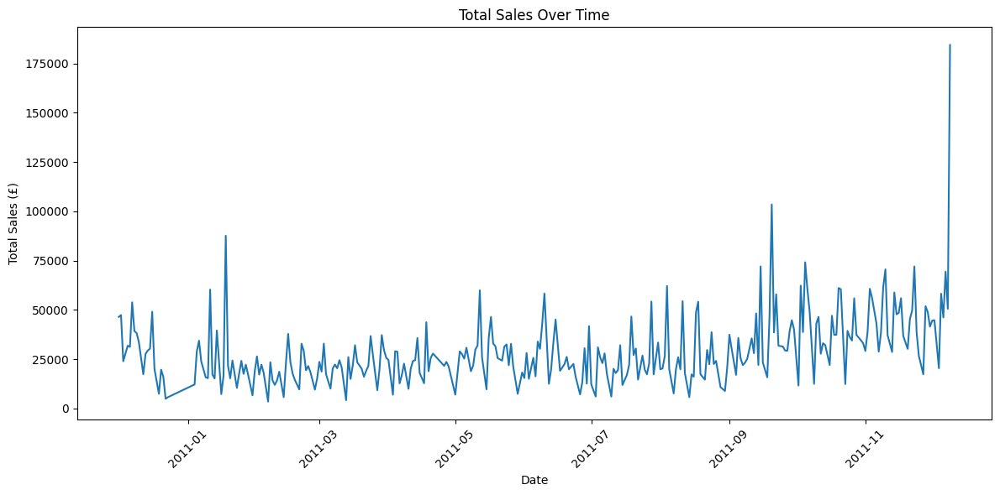

In [ ]:
## Initial Data Analysis:-
df_eda = df
df_eda['TotalSales'] = df['Quantity'] * df['UnitPrice']

# We group by date and sum the total sales
daily_sales = df.groupby(df['InvoiceDate'].dt.date)['TotalSales'].sum()

# we then plot total sales over time
plt.figure(figsize=(12, 6))
daily_sales.plot()
plt.title('Total Sales Over Time')
plt.xlabel('Date')
plt.ylabel('Total Sales (£)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

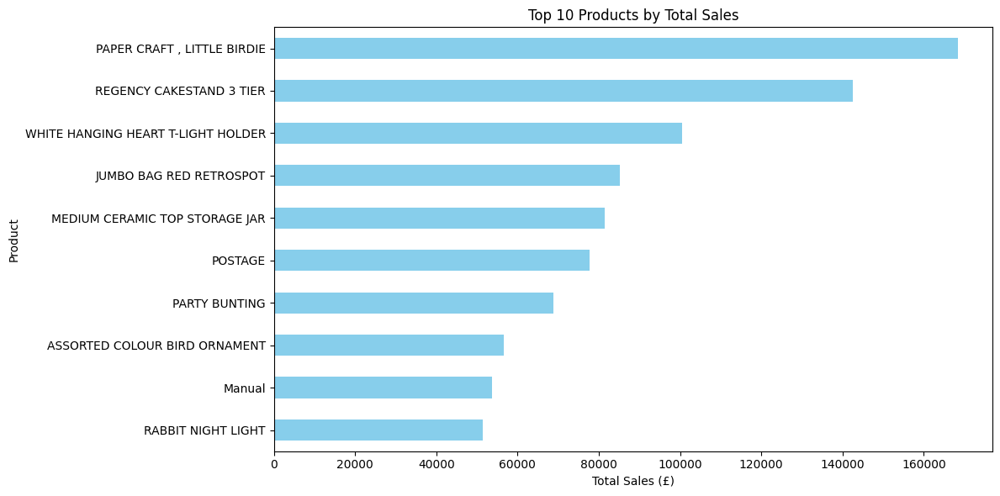

In [ ]:
top_products = df.groupby('Description')['TotalSales'].sum().nlargest(10)

# We plot top products by total sales
plt.figure(figsize=(12, 6))
top_products.sort_values().plot(kind='barh', color='skyblue')
plt.title('Top 10 Products by Total Sales')
plt.xlabel('Total Sales (£)')
plt.ylabel('Product')
plt.tight_layout()
plt.show()

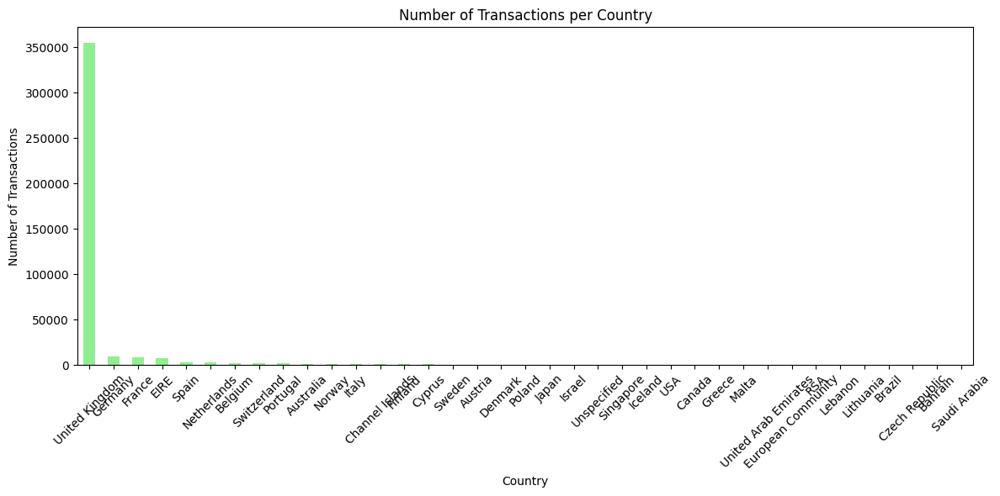

In [ ]:
country_counts = df['Country'].value_counts()

# We plot number of transactions per country
plt.figure(figsize=(12, 6))
country_counts.plot(kind='bar', color='lightgreen')
plt.title('Number of Transactions per Country')
plt.xlabel('Country')
plt.ylabel('Number of Transactions')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## 4.1) Market Basket Analysis for German Data

In [ ]:
df1 = df[df['Country'] == 'Germany'] #First we select all rows where the country is Germany

In [ ]:
df1.head() #Updated dataframe

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalSales
1109,536527,22809,SET OF 6 T-LIGHTS SANTA,6,2010-12-01 13:04:00,2.95,12662.0,Germany,17.7
1110,536527,84347,ROTATING SILVER ANGELS T-LIGHT HLDR,6,2010-12-01 13:04:00,2.55,12662.0,Germany,15.3
1111,536527,84945,MULTI COLOUR SILVER T-LIGHT HOLDER,12,2010-12-01 13:04:00,0.85,12662.0,Germany,10.2
1112,536527,22242,5 HOOK HANGER MAGIC TOADSTOOL,12,2010-12-01 13:04:00,1.65,12662.0,Germany,19.8
1113,536527,22244,3 HOOK HANGER MAGIC GARDEN,12,2010-12-01 13:04:00,1.95,12662.0,Germany,23.4


In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9042 entries, 1109 to 541805
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   InvoiceNo    9042 non-null   object        
 1   StockCode    9042 non-null   object        
 2   Description  9042 non-null   object        
 3   Quantity     9042 non-null   int64         
 4   InvoiceDate  9042 non-null   datetime64[ns]
 5   UnitPrice    9042 non-null   float64       
 6   CustomerID   9042 non-null   float64       
 7   Country      9042 non-null   object        
 8   TotalSales   9042 non-null   float64       
dtypes: datetime64[ns](1), float64(3), int64(1), object(4)
memory usage: 706.4+ KB


In [ ]:
#Creating the basket to apply apriori algorithm on
basket_1 = df1.groupby(['InvoiceNo', 'Description'])['Quantity'].sum().unstack().reset_index().fillna(0).set_index('InvoiceNo')
def encode_units(x):
    if x <= 0:
        return 0
    if x >= 1:
        return 1

#apply function to data using applymap.
basket_1 = basket_1.applymap(encode_units)
basket_1.head()

<ipython-input-25-6712d82d555e>:10: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  basket_1 = basket_1.applymap(encode_units)


Description  10 COLOUR SPACEBOY PEN  12 COLOURED PARTY BALLOONS  \
InvoiceNo                                                         
536527                            0                           0   
536840                            0                           0   
536861                            0                           0   
536967                            0                           0   
536983                            0                           0   

Description  12 IVORY ROSE PEG PLACE SETTINGS  \
InvoiceNo                                       
536527                                      0   
536840                                      0   
536861                                      0   
536967                                      0   
536983                                      0   

Description  12 MESSAGE CARDS WITH ENVELOPES  12 PENCIL SMALL TUBE WOODLAND  \
InvoiceNo                                                                     
536527                                     0                              0   
536840                                     0                              0   
536861                                     0                              0   
536967                                     0                              0   
536983                                     0                              0   

Description  12 PENCILS SMALL TUBE RED RETROSPOT  12 PENCILS SMALL TUBE SKULL  \
InvoiceNo                                                                       
536527                                         0                            0   
536840                                         0                            0   
536861                                         0                            0   
536967                                         0                            0   
536983                                         0                            0   

Description  12 PENCILS TALL TUBE POSY  12 PENCILS TALL TUBE RED RETROSPOT  \
InvoiceNo                                                                    
536527                               0                                   0   
536840                               0                                   0   
536861                               0                                   0   
536967                               0                                   0   
536983                               0                                   0   

Description  12 PENCILS TALL TUBE SKULLS  12 PENCILS TALL TUBE WOODLAND  \
InvoiceNo                                                                 
536527                                 0                              0   
536840                                 0                              0   
536861                                 0                              0   
536967                                 0                              0   
536983                                 0                              0   

Description  12 PINK HEN+CHICKS IN BASKET  12 RED ROSE PEG PLACE SETTINGS  \
InvoiceNo                                                                   
536527                                  0                               0   
536840                                  0                               0   
536861                                  0                               0   
536967                                  0                               0   
536983                                  0                               0   

Description  16 PIECE CUTLERY SET PANTRY DESIGN  \
InvoiceNo                                         
536527                                        0   
536840                                        0   
536861                                        0   
536967                                        0   
536983                                        0   

Description  2 PICTURE BOOK EGGS EASTER BUNNY  \
InvoiceNo                                   

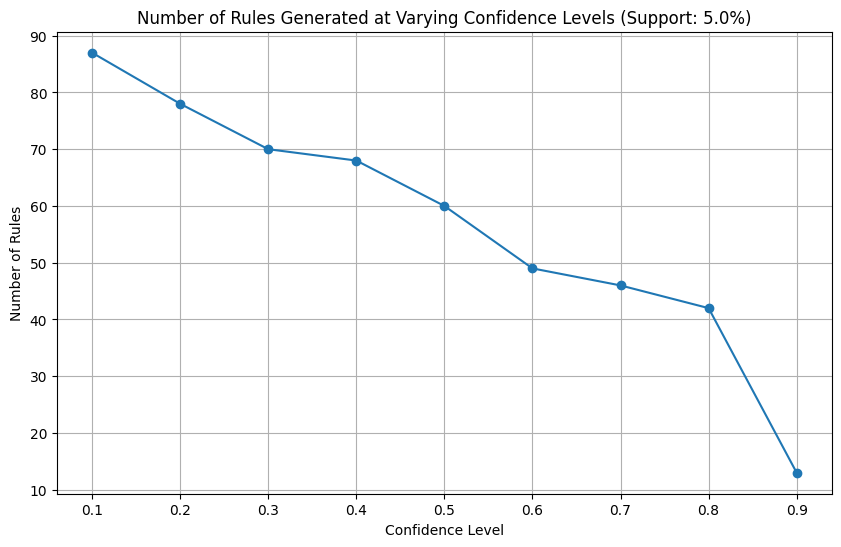

In [ ]:
#Checking for support = 0.05
min_support = 0.05
#APRIORI ALGORITHM
def get_frequent_itemsets(data, min_support):
    itemsets = {}
    num_transactions = len(data)

    # 1-itemsets
    for item in data.columns:
        support = data[item].sum() / num_transactions
        if support >= min_support:
            itemsets[frozenset([item])] = support

    k = 2
    current_itemsets = itemsets

    while current_itemsets:
        # Generate candidate k-itemsets from (k-1)-itemsets
        candidate_itemsets = {}
        keys = list(current_itemsets.keys())
        for i in range(len(keys)):
            for j in range(i + 1, len(keys)):
                union_set = keys[i] | keys[j]
                if len(union_set) == k:
                    support = (data[list(union_set)].min(axis=1) > 0).sum() / num_transactions
                    if support >= min_support:
                        candidate_itemsets[union_set] = support

        # Add candidate k-itemsets to frequent itemsets
        itemsets.update(candidate_itemsets)
        current_itemsets = candidate_itemsets
        k += 1

    return itemsets

frequent_itemsets = get_frequent_itemsets(basket_1, min_support)

# Function to generate association rules with variable confidence
def get_association_rules(frequent_itemsets, confidence):
    rules = []
    for itemset in frequent_itemsets.keys():
        if len(itemset) > 1:
            for antecedent in map(frozenset, combinations(itemset, len(itemset) - 1)):
                consequent = itemset - antecedent
                support = frequent_itemsets[itemset]
                antecedent_support = frequent_itemsets[antecedent]
                rule_confidence = support / antecedent_support
                if rule_confidence >= confidence:
                    lift = rule_confidence / frequent_itemsets[consequent]
                    rules.append((antecedent, consequent, support, rule_confidence, lift))
    return pd.DataFrame(rules, columns=['Antecedent', 'Consequent', 'Support', 'Confidence', 'Lift'])

# We define confidence levels to test and list to store rule counts
confidence_levels = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
rule_counts = []

# We generate rules for each confidence level and store the count
for confidence in confidence_levels:
    rules = get_association_rules(frequent_itemsets, confidence)
    rule_counts.append(len(rules))

# Plotting the results
plt.figure(figsize=(10, 6))
plt.plot(confidence_levels, rule_counts, marker='o')
plt.title(f'Number of Rules Generated at Varying Confidence Levels (Support: {min_support*100}%)')
plt.xlabel('Confidence Level')
plt.ylabel('Number of Rules')
plt.grid()
plt.show()

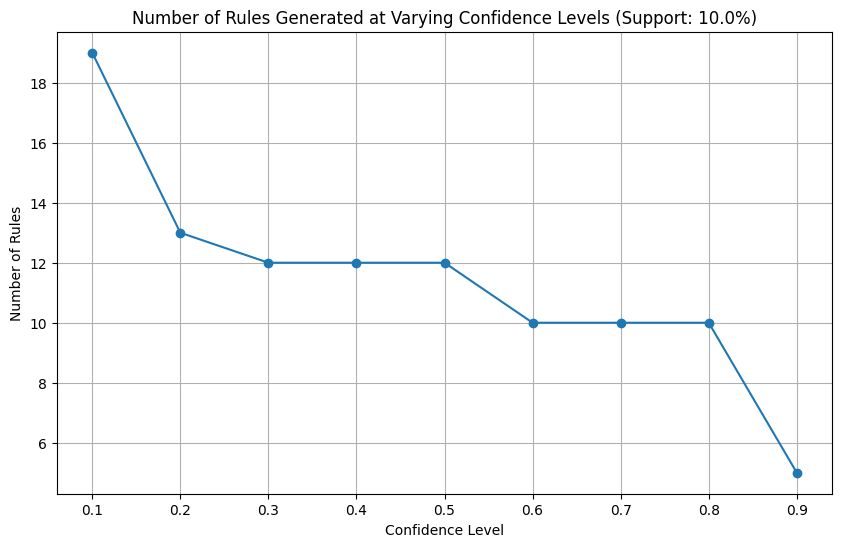

In [ ]:
#Checking for support = 0.10
min_support = 0.10

def get_frequent_itemsets(data, min_support):
    itemsets = {}
    num_transactions = len(data)

    # 1-itemsets
    for item in data.columns:
        support = data[item].sum() / num_transactions
        if support >= min_support:
            itemsets[frozenset([item])] = support

    k = 2
    current_itemsets = itemsets

    while current_itemsets:
        # Generate candidate k-itemsets from (k-1)-itemsets
        candidate_itemsets = {}
        keys = list(current_itemsets.keys())
        for i in range(len(keys)):
            for j in range(i + 1, len(keys)):
                union_set = keys[i] | keys[j]
                if len(union_set) == k:
                    support = (data[list(union_set)].min(axis=1) > 0).sum() / num_transactions
                    if support >= min_support:
                        candidate_itemsets[union_set] = support

        # Add candidate k-itemsets to frequent itemsets
        itemsets.update(candidate_itemsets)
        current_itemsets = candidate_itemsets
        k += 1

    return itemsets

frequent_itemsets = get_frequent_itemsets(basket_1, min_support)

# Function to generate association rules with variable confidence
def get_association_rules(frequent_itemsets, confidence):
    rules = []
    for itemset in frequent_itemsets.keys():
        if len(itemset) > 1:
            for antecedent in map(frozenset, combinations(itemset, len(itemset) - 1)):
                consequent = itemset - antecedent
                support = frequent_itemsets[itemset]
                antecedent_support = frequent_itemsets[antecedent]
                rule_confidence = support / antecedent_support
                if rule_confidence >= confidence:
                    lift = rule_confidence / frequent_itemsets[consequent]
                    rules.append((antecedent, consequent, support, rule_confidence, lift))
    return pd.DataFrame(rules, columns=['Antecedent', 'Consequent', 'Support', 'Confidence', 'Lift'])

# We define confidence levels to test and list to store rule counts
confidence_levels = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
rule_counts = []

# Next we generate rules for each confidence level and store the count
for confidence in confidence_levels:
    rules = get_association_rules(frequent_itemsets, confidence)
    rule_counts.append(len(rules))

# Plotting the results
plt.figure(figsize=(10, 6))
plt.plot(confidence_levels, rule_counts, marker='o')
plt.title(f'Number of Rules Generated at Varying Confidence Levels (Support: {min_support*100}%)')
plt.xlabel('Confidence Level')
plt.ylabel('Number of Rules')
plt.grid()
plt.show()

In [ ]:
#Selecting appropriate support and confidence metrics for our analysis
min_support_1 = 0.05
min_confidence_1 = 0.5
frequent_itemsets_1 = get_frequent_itemsets(basket_1, min_support_1)
rules_apriori_1 = get_association_rules(frequent_itemsets_1, min_confidence_1)
rules_apriori_1 #printing the generated rules

,Antecedent,Consequent,Support,Confidence,Lift
0,(6 RIBBONS RUSTIC CHARM),(POSTAGE),0.091904,0.893617,1.091933
1,(ALARM CLOCK BAKELIKE PINK),(POSTAGE),0.050328,0.718750,0.878259
2,(CHARLOTTE BAG APPLES DESIGN),(POSTAGE),0.061269,0.933333,1.140463
3,(COFFEE MUG APPLES DESIGN),(POSTAGE),0.054705,0.892857,1.091005
4,(FAWN BLUE HOT WATER BOTTLE),(POSTAGE),0.059081,0.931034,1.137654
5,(GUMBALL COAT RACK),(POSTAGE),0.056893,0.787879,0.962729
6,(JAM JAR WITH PINK LID),(POSTAGE),0.054705,0.862069,1.053384
7,(JAM MAKING SET PRINTED),(POSTAGE),0.074398,0.809524,0.989177
8,(JUMBO BAG APPLES),(POSTAGE),0.052516,0.857143,1.047364
9,(JUMBO BAG RED RETROSPOT),(POSTAGE),0.063457,0.805556,0.984329


In [ ]:
rules_apriori_1.shape #Checking the no of rules generated

(60, 5)

In [ ]:
# Display top 10 rules by Support
top_10_support = rules_apriori_1.sort_values(by="Support", ascending=False).head(10)
print("Top 10 Rules by Support")
print(tabulate(top_10_support, headers='keys', tablefmt='pretty'))

# Display top 10 rules by Confidence
top_10_confidence = rules_apriori_1.sort_values(by="Confidence", ascending=False).head(10)
print("\nTop 10 Rules by Confidence")
print(tabulate(top_10_confidence, headers='keys', tablefmt='pretty'))

# Display top 10 rules by Lift
top_10_lift = rules_apriori_1.sort_values(by="Lift", ascending=False).head(10)
print("\nTop 10 Rules by Lift")
print(tabulate(top_10_lift, headers='keys', tablefmt='pretty'))

Top 10 Rules by Support
+----+----------------------------------------------------------------------------------------+---------------------------------------------------+---------------------+--------------------+--------------------+
|    |                                       Antecedent                                       |                    Consequent                     |       Support       |     Confidence     |        Lift        |
+----+----------------------------------------------------------------------------------------+---------------------------------------------------+---------------------+--------------------+--------------------+
| 31 |                   frozenset({'ROUND SNACK BOXES SET OF4 WOODLAND'})                    |              frozenset({'POSTAGE'})               | 0.22538293216630198 | 0.9196428571428572 | 1.1237347211611919 |
| 30 |                    frozenset({'ROUND SNACK BOXES SET OF 4 FRUITS'})                    |              frozenset({'POSTAGE

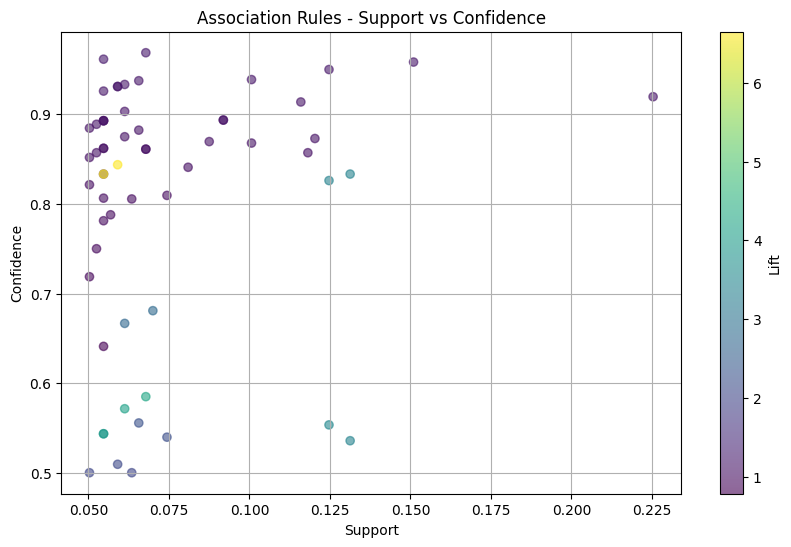

In [ ]:
#Plotting a scatter plot for analysis
plt.figure(figsize=(10, 6))
scatter = plt.scatter(rules_apriori_1['Support'], rules_apriori_1['Confidence'],
                      c=rules_apriori_1['Lift'], cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Lift')
plt.title('Association Rules - Support vs Confidence')
plt.xlabel('Support')
plt.ylabel('Confidence')
plt.grid(True)
plt.show()

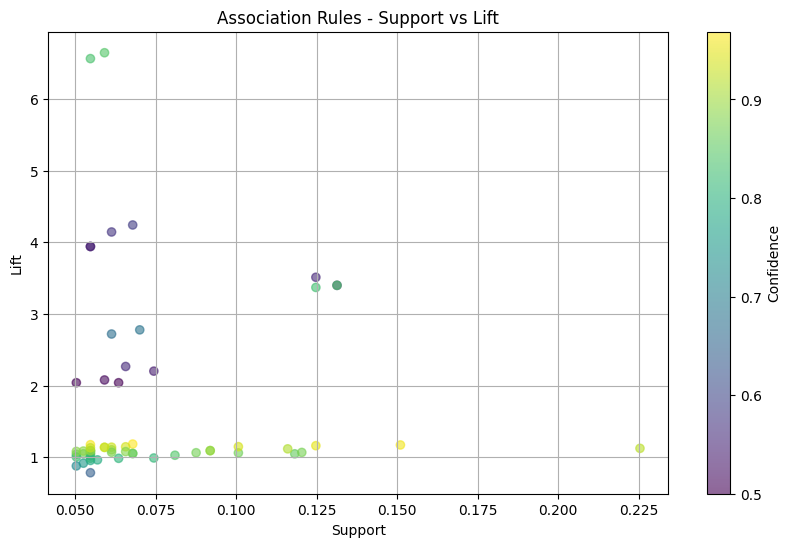

In [ ]:
#Plotting a scatter plot for analysis
plt.figure(figsize=(10, 6))
scatter = plt.scatter(rules_apriori_1['Support'], rules_apriori_1['Lift'],
                      c=rules_apriori_1['Confidence'], cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Confidence')
plt.title('Association Rules - Support vs Lift')
plt.xlabel('Support')
plt.ylabel('Lift')
plt.grid(True)
plt.show()

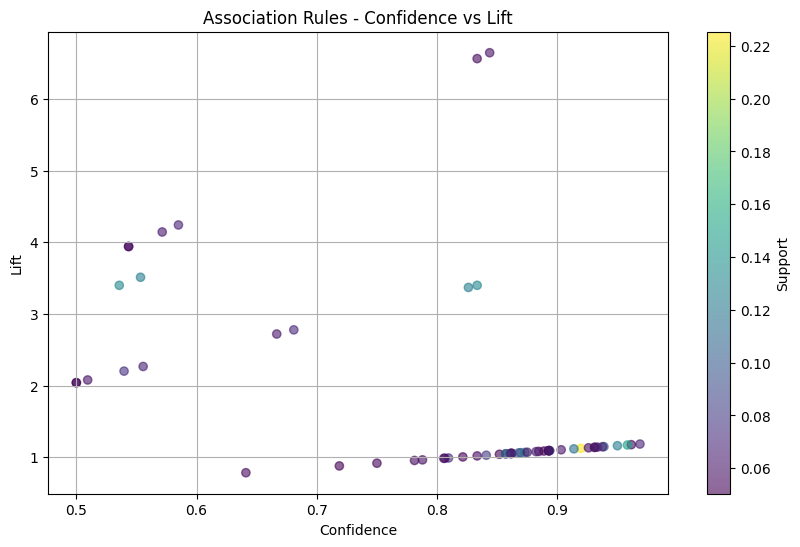

In [ ]:
#Plotting a scatter plot for analysis
plt.figure(figsize=(10, 6))
scatter = plt.scatter(rules_apriori_1['Confidence'], rules_apriori_1['Lift'],
                      c=rules_apriori_1['Support'], cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Support')
plt.title('Association Rules - Confidence vs Lift')
plt.xlabel('Confidence')
plt.ylabel('Lift')
plt.grid(True)
plt.show()

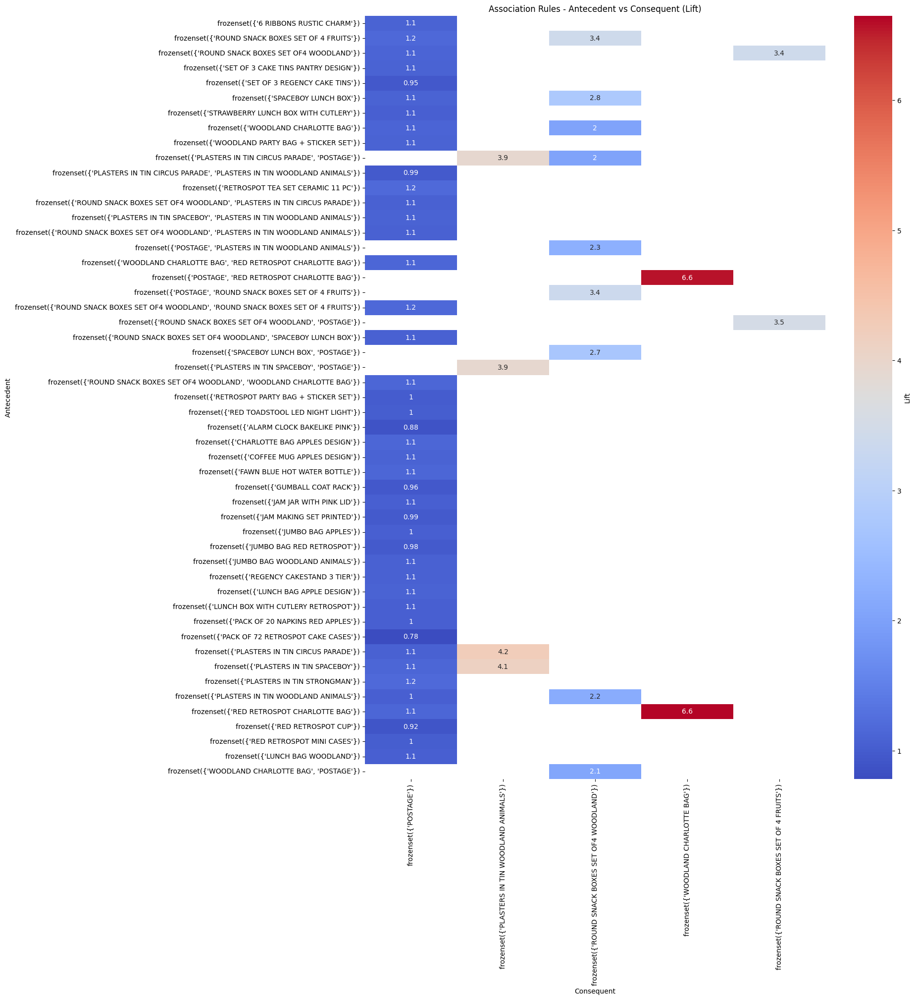

In [ ]:
#Plotting a pivot table for analysis
pivot_table = rules_apriori_1.pivot(index='Antecedent', columns='Consequent', values='Lift')
plt.figure(figsize=(15, 20))
sns.heatmap(pivot_table, annot=True, cmap='coolwarm', cbar_kws={'label': 'Lift'})
plt.title('Association Rules - Antecedent vs Consequent (Lift)')
plt.xlabel('Consequent')
plt.ylabel('Antecedent')
plt.show()

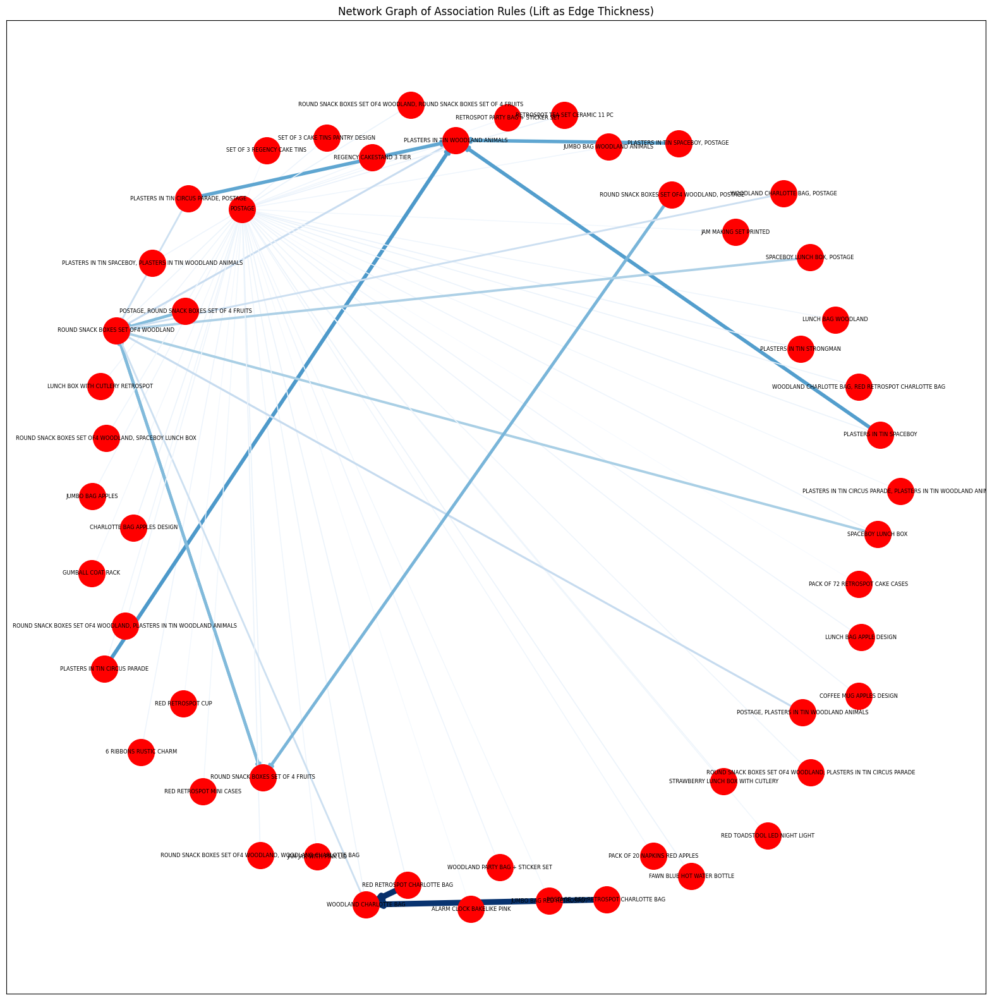

In [ ]:
#Plotting a network graph amongst the rules to visualize the rules
G = nx.DiGraph()

# Add edges to the graph with lift as edge attribute
for _, row in rules_apriori_1.iterrows():
    G.add_edge(', '.join(row['Antecedent']), ', '.join(row['Consequent']), weight=row['Lift'])

# Draw the graph
plt.figure(figsize=(20, 20))
pos = nx.spring_layout(G, k=4)  # positions for all nodes

# Draw nodes and edges with color and thickness based on lift
edges = G.edges(data=True)
nx.draw_networkx_nodes(G, pos, node_size=900, node_color='red')
nx.draw_networkx_labels(G, pos, font_size=6)
nx.draw_networkx_edges(G, pos, edgelist=edges, width=[d['weight'] * 1 for (_, _, d) in edges],
                       edge_color=[d['weight'] for (_, _, d) in edges], edge_cmap=plt.cm.Blues)

plt.title('Network Graph of Association Rules (Lift as Edge Thickness)')
plt.show()

## 4.2) Market Basket Analysis for French Data

In [ ]:
df2 = df[df['Country'] == 'France']  #First we select all rows where the country is France

In [ ]:
df2.head() #Updated dataframe

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalSales
26,536370,22728,ALARM CLOCK BAKELIKE PINK,24,2010-12-01 08:45:00,3.75,12583.0,France,90.0
27,536370,22727,ALARM CLOCK BAKELIKE RED,24,2010-12-01 08:45:00,3.75,12583.0,France,90.0
28,536370,22726,ALARM CLOCK BAKELIKE GREEN,12,2010-12-01 08:45:00,3.75,12583.0,France,45.0
29,536370,21724,PANDA AND BUNNIES STICKER SHEET,12,2010-12-01 08:45:00,0.85,12583.0,France,10.2
30,536370,21883,STARS GIFT TAPE,24,2010-12-01 08:45:00,0.65,12583.0,France,15.6


In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8342 entries, 26 to 541908
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   InvoiceNo    8342 non-null   object        
 1   StockCode    8342 non-null   object        
 2   Description  8342 non-null   object        
 3   Quantity     8342 non-null   int64         
 4   InvoiceDate  8342 non-null   datetime64[ns]
 5   UnitPrice    8342 non-null   float64       
 6   CustomerID   8342 non-null   float64       
 7   Country      8342 non-null   object        
 8   TotalSales   8342 non-null   float64       
dtypes: datetime64[ns](1), float64(3), int64(1), object(4)
memory usage: 651.7+ KB


In [ ]:
#Creating the basket to apply apriori algorithm on
basket_2 = df2.groupby(['InvoiceNo', 'Description'])['Quantity'].sum().unstack().reset_index().fillna(0).set_index('InvoiceNo')
def encode_units(x):
    if x <= 0:
        return 0
    if x >= 1:
        return 1
#apply function to data using applymap.
basket_2 = basket_2.applymap(encode_units)


basket_2.head()

<ipython-input-39-29826aa800c7>:8: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  basket_2 = basket_2.applymap(encode_units)


Description  10 COLOUR SPACEBOY PEN  12 COLOURED PARTY BALLOONS  \
InvoiceNo                                                         
536370                            0                           0   
536852                            0                           0   
536974                            0                           0   
537065                            0                           0   
537463                            0                           0   

Description  12 EGG HOUSE PAINTED WOOD  12 MESSAGE CARDS WITH ENVELOPES  \
InvoiceNo                                                                 
536370                               0                                0   
536852                               0                                0   
536974                               0                                0   
537065                               0                                0   
537463                               0                                0   

Description  12 PENCIL SMALL TUBE WOODLAND  \
InvoiceNo                                    
536370                                   0   
536852                                   0   
536974                                   0   
537065                                   0   
537463                                   0   

Description  12 PENCILS SMALL TUBE RED RETROSPOT  12 PENCILS SMALL TUBE SKULL  \
InvoiceNo                                                                       
536370                                         0                            0   
536852                                         0                            0   
536974                                         0                            0   
537065                                         0                            0   
537463                                         0                            0   

Description  12 PENCILS TALL TUBE POSY  12 PENCILS TALL TUBE RED RETROSPOT  \
InvoiceNo                                                                    
536370                               0                                   0   
536852                               0                                   0   
536974                               0                                   0   
537065                               0                                   0   
537463                               0                                   0   

Description  12 PENCILS TALL TUBE WOODLAND  \
InvoiceNo                                    
536370                                   0   
536852                                   0   
536974                                   0   
537065                                   0   
537463                                   0   

Description  15CM CHRISTMAS GLASS BALL 20 LIGHTS  \
InvoiceNo                                          
536370                                         0   
536852                                         0   
536974                                         0   
537065                                         0   
537463                                         0   

Description  16 PIECE CUTLERY SET PANTRY DESIGN  \
InvoiceNo                                         
536370                                        0   
536852                                        0   
536974                                        0   
537065                                        0   
537463                                        0   

Description  18PC WOODEN CUTLERY SET DISPOSABLE  20 DOLLY PEGS RETROSPOT  \
InvoiceNo                                                                  
536370                                        0                        0   
536852                                        0                        0   
536974                                        0                        0   
537065                                        0                        0   
537463                                        0                 

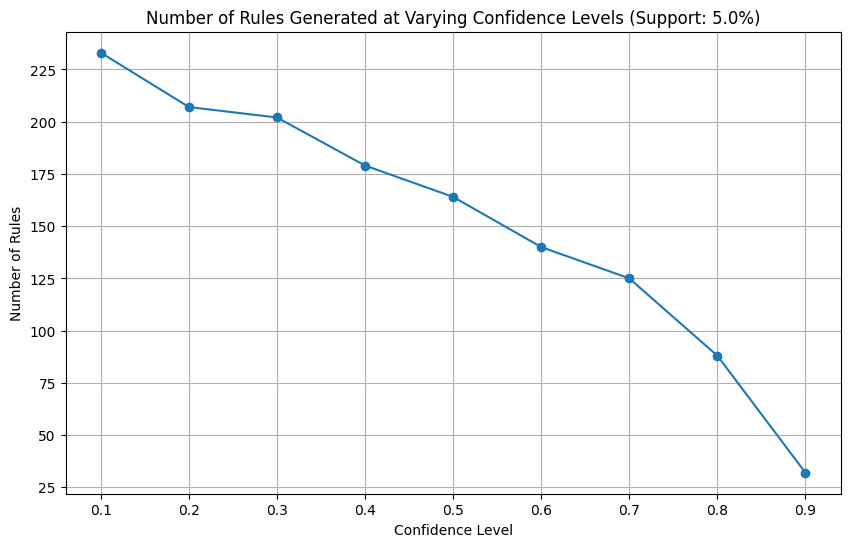

In [ ]:
#Checking for support = 0.05
min_support = 0.05
#APRIORI ALGORITHM
def get_frequent_itemsets(data, min_support):
    itemsets = {}
    num_transactions = len(data)

    # 1-itemsets
    for item in data.columns:
        support = data[item].sum() / num_transactions
        if support >= min_support:
            itemsets[frozenset([item])] = support

    k = 2
    current_itemsets = itemsets

    while current_itemsets:
        # Generate candidate k-itemsets from (k-1)-itemsets
        candidate_itemsets = {}
        keys = list(current_itemsets.keys())
        for i in range(len(keys)):
            for j in range(i + 1, len(keys)):
                union_set = keys[i] | keys[j]
                if len(union_set) == k:
                    support = (data[list(union_set)].min(axis=1) > 0).sum() / num_transactions
                    if support >= min_support:
                        candidate_itemsets[union_set] = support

        # Add candidate k-itemsets to frequent itemsets
        itemsets.update(candidate_itemsets)
        current_itemsets = candidate_itemsets
        k += 1

    return itemsets

frequent_itemsets = get_frequent_itemsets(basket_2, min_support)

# Function to generate association rules with variable confidence
def get_association_rules(frequent_itemsets, confidence):
    rules = []
    for itemset in frequent_itemsets.keys():
        if len(itemset) > 1:
            for antecedent in map(frozenset, combinations(itemset, len(itemset) - 1)):
                consequent = itemset - antecedent
                support = frequent_itemsets[itemset]
                antecedent_support = frequent_itemsets[antecedent]
                rule_confidence = support / antecedent_support
                if rule_confidence >= confidence:
                    lift = rule_confidence / frequent_itemsets[consequent]
                    rules.append((antecedent, consequent, support, rule_confidence, lift))
    return pd.DataFrame(rules, columns=['Antecedent', 'Consequent', 'Support', 'Confidence', 'Lift'])

# We define confidence levels to test and list to store rule counts
confidence_levels = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
rule_counts = []

# Next wenerate rules for each confidence level and store the count
for confidence in confidence_levels:
    rules = get_association_rules(frequent_itemsets, confidence)
    rule_counts.append(len(rules))

# Plotting the results
plt.figure(figsize=(10, 6))
plt.plot(confidence_levels, rule_counts, marker='o')
plt.title(f'Number of Rules Generated at Varying Confidence Levels (Support: {min_support*100}%)')
plt.xlabel('Confidence Level')
plt.ylabel('Number of Rules')
plt.grid()
plt.show()

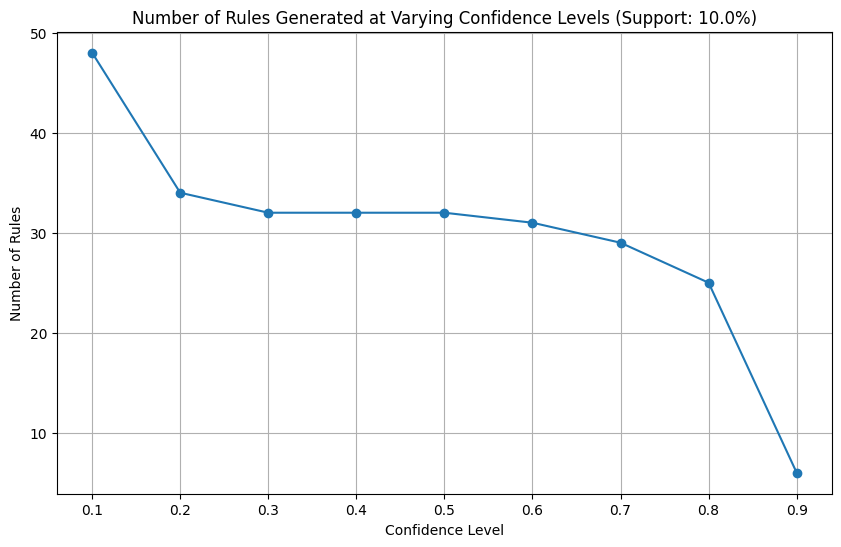

In [ ]:
#Checking for support = 0.10
min_support = 0.10
#APRIORI ALGORITHM
def get_frequent_itemsets(data, min_support):
    itemsets = {}
    num_transactions = len(data)

    # 1-itemsets
    for item in data.columns:
        support = data[item].sum() / num_transactions
        if support >= min_support:
            itemsets[frozenset([item])] = support

    k = 2
    current_itemsets = itemsets

    while current_itemsets:
        # Generate candidate k-itemsets from (k-1)-itemsets
        candidate_itemsets = {}
        keys = list(current_itemsets.keys())
        for i in range(len(keys)):
            for j in range(i + 1, len(keys)):
                union_set = keys[i] | keys[j]
                if len(union_set) == k:
                    support = (data[list(union_set)].min(axis=1) > 0).sum() / num_transactions
                    if support >= min_support:
                        candidate_itemsets[union_set] = support

        # Add candidate k-itemsets to frequent itemsets
        itemsets.update(candidate_itemsets)
        current_itemsets = candidate_itemsets
        k += 1

    return itemsets

frequent_itemsets = get_frequent_itemsets(basket_2, min_support)

# Function to generate association rules with variable confidence
def get_association_rules(frequent_itemsets, confidence):
    rules = []
    for itemset in frequent_itemsets.keys():
        if len(itemset) > 1:
            for antecedent in map(frozenset, combinations(itemset, len(itemset) - 1)):
                consequent = itemset - antecedent
                support = frequent_itemsets[itemset]
                antecedent_support = frequent_itemsets[antecedent]
                rule_confidence = support / antecedent_support
                if rule_confidence >= confidence:
                    lift = rule_confidence / frequent_itemsets[consequent]
                    rules.append((antecedent, consequent, support, rule_confidence, lift))
    return pd.DataFrame(rules, columns=['Antecedent', 'Consequent', 'Support', 'Confidence', 'Lift'])

# We define confidence levels to test and list to store rule counts
confidence_levels = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
rule_counts = []

# Next wenerate rules for each confidence level and store the count
for confidence in confidence_levels:
    rules = get_association_rules(frequent_itemsets, confidence)
    rule_counts.append(len(rules))

# Plotting the results
plt.figure(figsize=(10, 6))
plt.plot(confidence_levels, rule_counts, marker='o')
plt.title(f'Number of Rules Generated at Varying Confidence Levels (Support: {min_support*100}%)')
plt.xlabel('Confidence Level')
plt.ylabel('Number of Rules')
plt.grid()
plt.show()

In [ ]:
#Selecting appropriate support and confidence metrics for our analysis
min_support = 0.10
min_confidence = 0.5
frequent_itemsets_2 = get_frequent_itemsets(basket_2, min_support)
rules_apriori_2 = get_association_rules(frequent_itemsets_2, min_confidence)

# Display the generated rules
rules_apriori_2

,Antecedent,Consequent,Support,Confidence,Lift
0,(LUNCH BAG APPLE DESIGN),(POSTAGE),0.105398,0.836735,1.084966
1,(LUNCH BAG RED RETROSPOT),(POSTAGE),0.123393,0.800000,1.037333
2,(LUNCH BAG WOODLAND),(POSTAGE),0.102828,0.869565,1.127536
3,(LUNCH BOX WITH CUTLERY RETROSPOT),(POSTAGE),0.115681,0.803571,1.041964
4,(PLASTERS IN TIN CIRCUS PARADE),(PLASTERS IN TIN WOODLAND ANIMALS),0.102828,0.606061,3.518770
5,(PLASTERS IN TIN WOODLAND ANIMALS),(PLASTERS IN TIN CIRCUS PARADE),0.102828,0.597015,3.518770
6,(PLASTERS IN TIN CIRCUS PARADE),(POSTAGE),0.149100,0.878788,1.139495
7,(PLASTERS IN TIN SPACEBOY),(PLASTERS IN TIN WOODLAND ANIMALS),0.105398,0.773585,4.491411
8,(PLASTERS IN TIN WOODLAND ANIMALS),(PLASTERS IN TIN SPACEBOY),0.105398,0.611940,4.491411
9,(PLASTERS IN TIN SPACEBOY),(POSTAGE),0.115681,0.849057,1.100943


In [ ]:
rules_apriori_2.shape #Checking the no of rules generated

(32, 5)

In [ ]:
# Display top 10 rules by Support
top_10_support = rules_apriori_2.sort_values(by="Support", ascending=False).head(10)
print("Top 10 Rules by Support")
print(tabulate(top_10_support, headers='keys', tablefmt='pretty'))

# Display top 10 rules by Confidence
top_10_confidence = rules_apriori_2.sort_values(by="Confidence", ascending=False).head(10)
print("\nTop 10 Rules by Confidence")
print(tabulate(top_10_confidence, headers='keys', tablefmt='pretty'))

# Display top 10 rules by Lift
top_10_lift = rules_apriori_2.sort_values(by="Lift", ascending=False).head(10)
print("\nTop 10 Rules by Lift")
print(tabulate(top_10_lift, headers='keys', tablefmt='pretty'))

Top 10 Rules by Support
+----+---------------------------------------------------+----------------------------------------------+---------------------+--------------------+--------------------+
|    |                    Antecedent                     |                  Consequent                  |       Support       |     Confidence     |        Lift        |
+----+---------------------------------------------------+----------------------------------------------+---------------------+--------------------+--------------------+
| 11 |         frozenset({'RABBIT NIGHT LIGHT'})         |            frozenset({'POSTAGE'})            | 0.16709511568123395 | 0.8904109589041097 | 1.1545662100456624 |
| 13 |   frozenset({'RED TOADSTOOL LED NIGHT LIGHT'})    |            frozenset({'POSTAGE'})            | 0.15938303341902313 | 0.8857142857142857 | 1.1484761904761904 |
| 15 | frozenset({'ROUND SNACK BOXES SET OF4 WOODLAND'}) |            frozenset({'POSTAGE'})            | 0.14910025706940874 

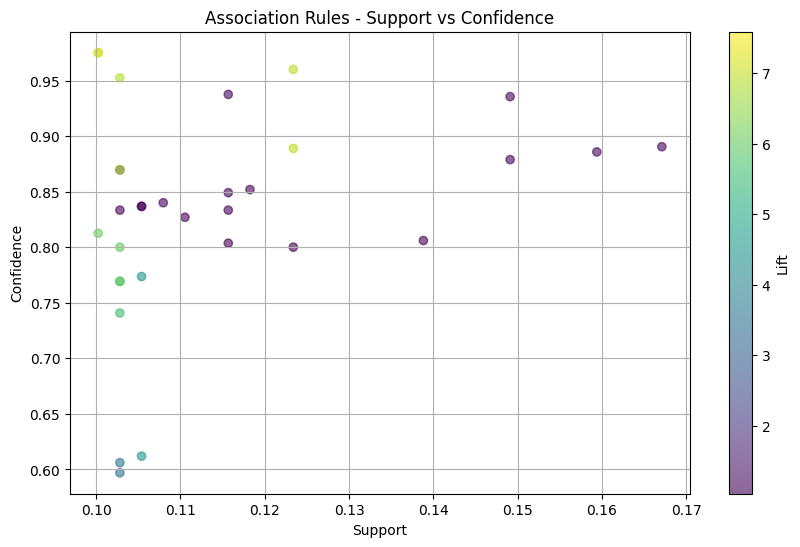

In [ ]:
#Plotting a scatter plot for analysis
plt.figure(figsize=(10, 6))
scatter = plt.scatter(rules_apriori_2['Support'], rules_apriori_2['Confidence'],
                      c=rules_apriori_2['Lift'], cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Lift')
plt.title('Association Rules - Support vs Confidence')
plt.xlabel('Support')
plt.ylabel('Confidence')
plt.grid(True)
plt.show()

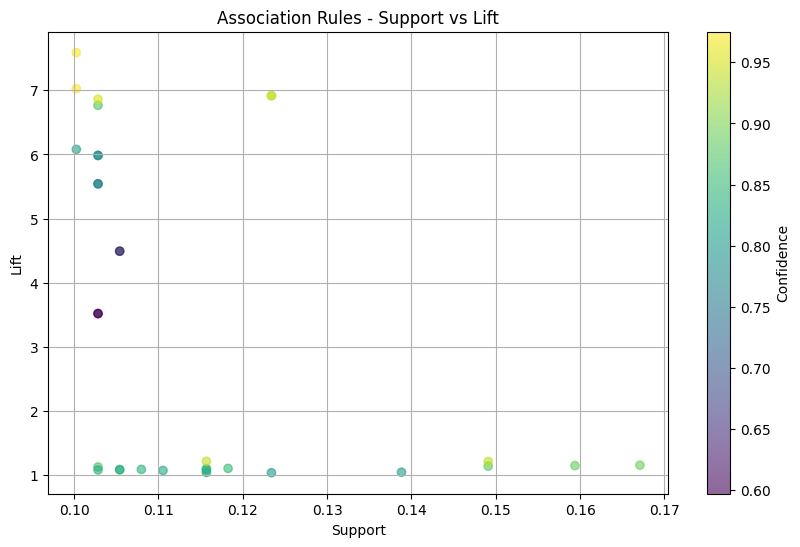

In [ ]:
#Plotting a scatter plot for analysis
plt.figure(figsize=(10, 6))
scatter = plt.scatter(rules_apriori_2['Support'], rules_apriori_2['Lift'],
                      c=rules_apriori_2['Confidence'], cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Confidence')
plt.title('Association Rules - Support vs Lift')
plt.xlabel('Support')
plt.ylabel('Lift')
plt.grid(True)
plt.show()

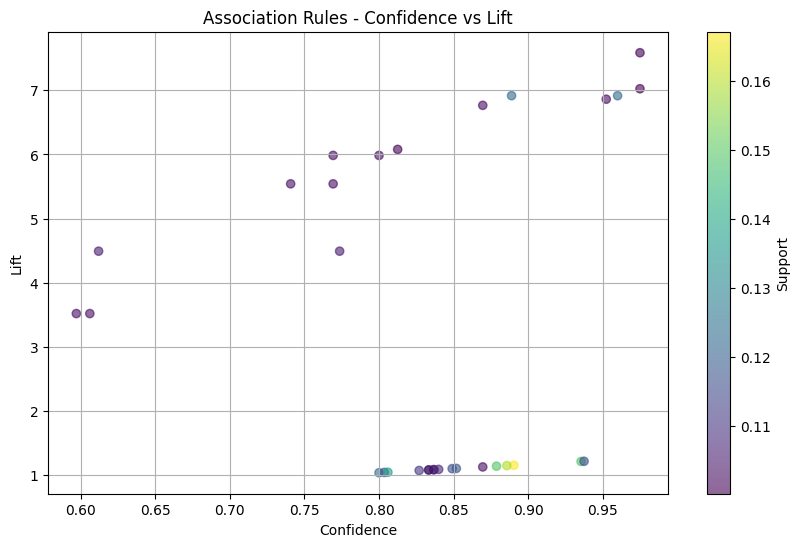

In [ ]:
#Plotting a scatter plot for analysis
plt.figure(figsize=(10, 6))
scatter = plt.scatter(rules_apriori_2['Confidence'], rules_apriori_2['Lift'],
                      c=rules_apriori_2['Support'], cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Support')
plt.title('Association Rules - Confidence vs Lift')
plt.xlabel('Confidence')
plt.ylabel('Lift')
plt.grid(True)
plt.show()

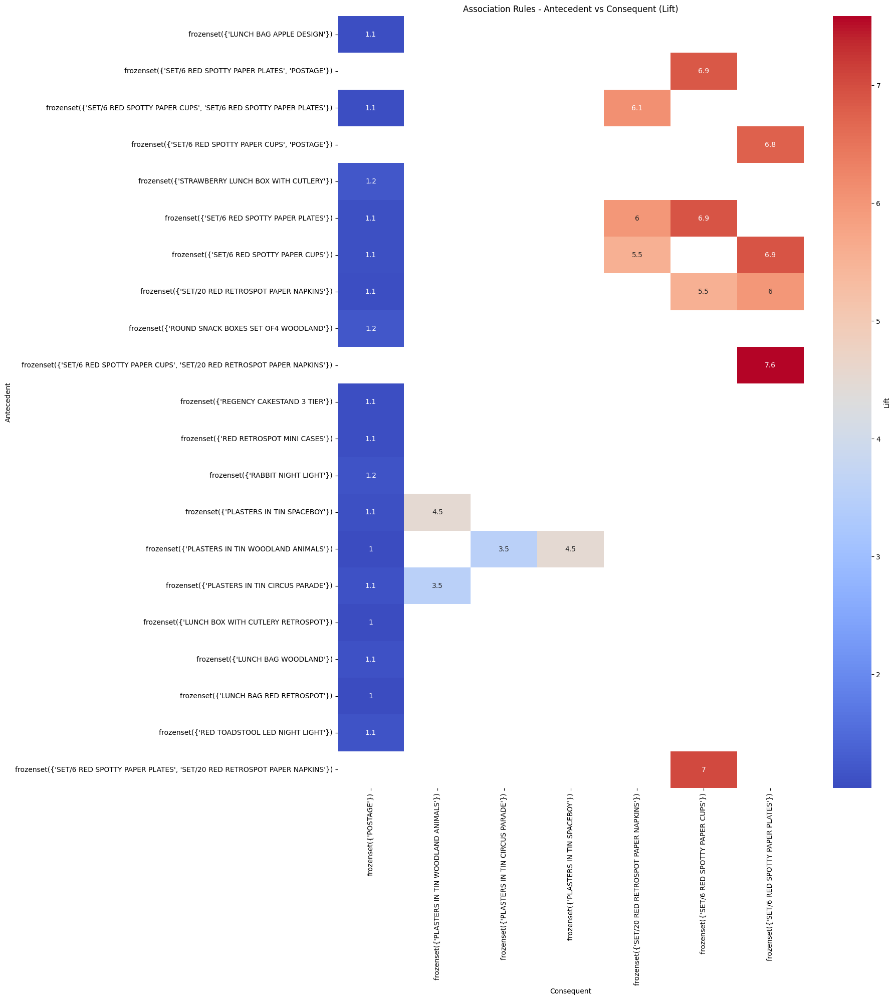

In [ ]:
pivot_table = rules_apriori_2.pivot(index='Antecedent', columns='Consequent', values='Lift')
plt.figure(figsize=(15, 20))
sns.heatmap(pivot_table, annot=True, cmap='coolwarm', cbar_kws={'label': 'Lift'})
plt.title('Association Rules - Antecedent vs Consequent (Lift)')
plt.xlabel('Consequent')
plt.ylabel('Antecedent')
plt.show()

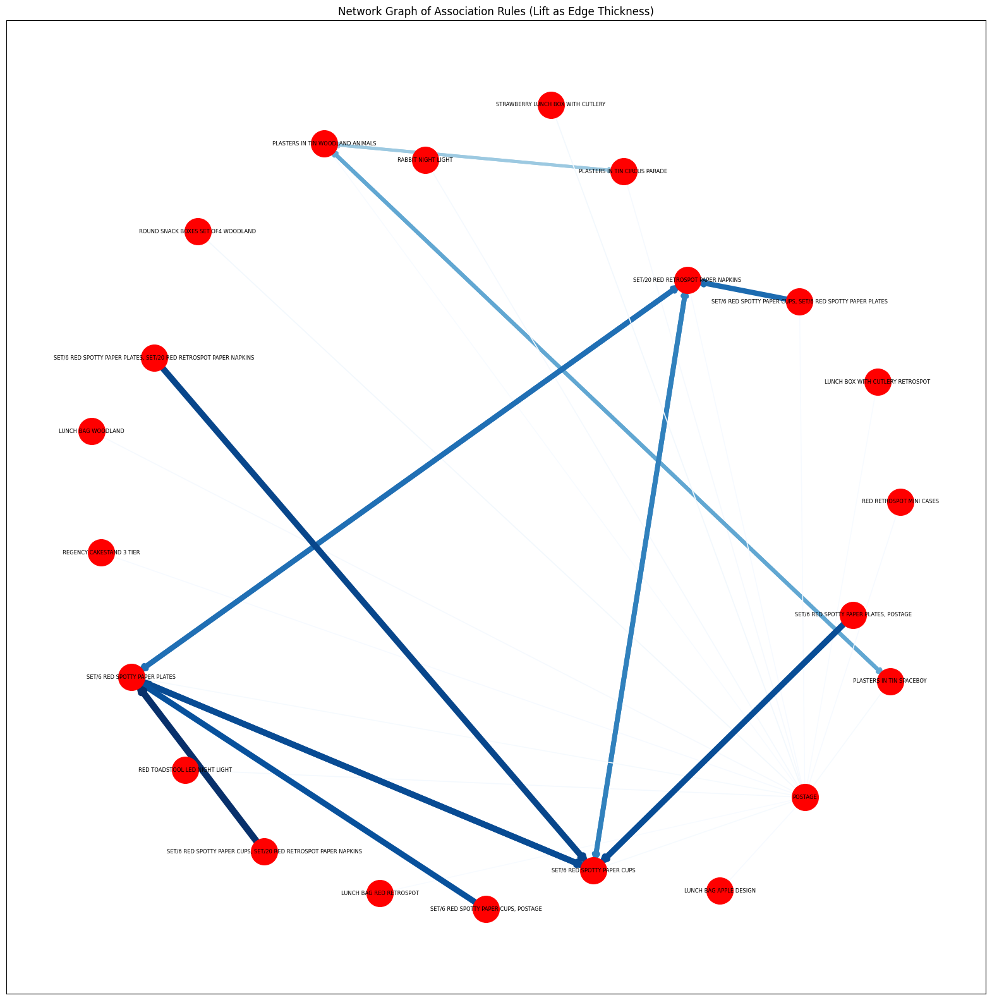

In [ ]:
#Plotting a network graph amongst the rules to visualize the rules
G = nx.DiGraph()

# Add edges to the graph with lift as edge attribute
for _, row in rules_apriori_2.iterrows():
    G.add_edge(', '.join(row['Antecedent']), ', '.join(row['Consequent']), weight=row['Lift'])

# Draw the graph
plt.figure(figsize=(20, 20))
pos = nx.spring_layout(G, k=4)  # positions for all nodes

# Draw nodes and edges with color and thickness based on lift
edges = G.edges(data=True)
nx.draw_networkx_nodes(G, pos, node_size=900, node_color='red')
nx.draw_networkx_labels(G, pos, font_size=6)
nx.draw_networkx_edges(G, pos, edgelist=edges, width=[d['weight'] * 1 for (_, _, d) in edges],
                       edge_color=[d['weight'] for (_, _, d) in edges], edge_cmap=plt.cm.Blues)

plt.title('Network Graph of Association Rules (Lift as Edge Thickness)')
plt.show()

## 4.3) Market Basket Analysis for Spain Data

In [ ]:
df3 = df[df['Country'] == 'Spain']  #First we select all rows where the country is Spain

In [ ]:
df3.head() #Updated dataframe

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalSales
6421,536944,22383,LUNCH BAG SUKI DESIGN,70,2010-12-03 12:20:00,1.65,12557.0,Spain,115.5
6422,536944,22384,LUNCH BAG PINK POLKADOT,100,2010-12-03 12:20:00,1.45,12557.0,Spain,145.0
6423,536944,20727,LUNCH BAG BLACK SKULL.,60,2010-12-03 12:20:00,1.65,12557.0,Spain,99.0
6424,536944,20725,LUNCH BAG RED RETROSPOT,70,2010-12-03 12:20:00,1.65,12557.0,Spain,115.5
6425,536944,20728,LUNCH BAG CARS BLUE,100,2010-12-03 12:20:00,1.45,12557.0,Spain,145.0


In [ ]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2485 entries, 6421 to 535275
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   InvoiceNo    2485 non-null   object        
 1   StockCode    2485 non-null   object        
 2   Description  2485 non-null   object        
 3   Quantity     2485 non-null   int64         
 4   InvoiceDate  2485 non-null   datetime64[ns]
 5   UnitPrice    2485 non-null   float64       
 6   CustomerID   2485 non-null   float64       
 7   Country      2485 non-null   object        
 8   TotalSales   2485 non-null   float64       
dtypes: datetime64[ns](1), float64(3), int64(1), object(4)
memory usage: 194.1+ KB


In [ ]:
#Creating the basket to apply apriori algorithm on
basket_3 = df3.groupby(['InvoiceNo', 'Description'])['Quantity'].sum().unstack().reset_index().fillna(0).set_index('InvoiceNo')
def encode_units(x):
    if x <= 0:
        return 0
    if x >= 1:
        return 1
#apply function to data using applymap.
basket_3 = basket_3.applymap(encode_units)
basket_3.head()

<ipython-input-53-674f5a5560b2>:8: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  basket_3 = basket_3.applymap(encode_units)


Description,10 COLOUR SPACEBOY PEN,12 EGG HOUSE PAINTED WOOD,12 MESSAGE CARDS WITH ENVELOPES,12 PENCIL SMALL TUBE WOODLAND,20 DOLLY PEGS RETROSPOT,200 RED + WHITE BENDY STRAWS,3 DRAWER ANTIQUE WHITE WOOD CABINET,3 HOOK HANGER MAGIC GARDEN,3 HOOK PHOTO SHELF ANTIQUE WHITE,3 PIECE SPACEBOY COOKIE CUTTER SET,3 RAFFIA RIBBONS 50'S CHRISTMAS,3 ROSE MORRIS BOXED CANDLES,3 STRIPEY MICE FELTCRAFT,3 TIER CAKE TIN GREEN AND CREAM,3 TIER CAKE TIN RED AND CREAM,3 TRADITIONAl BISCUIT CUTTERS SET,3 WHITE CHOC MORRIS BOXED CANDLES,36 DOILIES DOLLY GIRL,36 DOILIES VINTAGE CHRISTMAS,36 FOIL HEART CAKE CASES,36 FOIL STAR CAKE CASES,36 PENCILS TUBE RED RETROSPOT,36 PENCILS TUBE SKULLS,36 PENCILS TUBE WOODLAND,3D CHRISTMAS STAMPS STICKERS,3D TRADITIONAL CHRISTMAS STICKERS,3D VINTAGE CHRISTMAS STICKERS,4 TRADITIONAL SPINNING TOPS,5 HOOK HANGER RED MAGIC TOADSTOOL,50'S CHRISTMAS GIFT BAG LARGE,6 EGG HOUSE PAINTED WOOD,6 GIFT TAGS 50'S CHRISTMAS,6 GIFT TAGS VINTAGE CHRISTMAS,6 RIBBONS ELEGANT CHRISTMAS,6 RIBBONS EMPIRE,6 RIBBONS RUSTIC CHARM,6 RIBBONS SHIMMERING PINKS,60 CAKE CASES VINTAGE CHRISTMAS,60 TEATIME FAIRY CAKE CASES,72 SWEETHEART FAIRY CAKE CASES,ABC TREASURE BOOK BOX,ACRYLIC GEOMETRIC LAMP,ADULT APRON APPLE DELIGHT,AIRLINE BAG VINTAGE JET SET RED,ALARM CLOCK BAKELIKE CHOCOLATE,ALARM CLOCK BAKELIKE GREEN,ALARM CLOCK BAKELIKE PINK,ALARM CLOCK BAKELIKE RED,ALPHABET STENCIL CRAFT,ANTIQUE GLASS PLACE SETTING,ANTIQUE HEART SHELF UNIT,ANTIQUE SILVER TEA GLASS ETCHED,ASS FLORAL PRINT MULTI SCREWDRIVER,ASSORTED BOTTLE TOP MAGNETS,ASSORTED COLOUR BIRD ORNAMENT,ASSORTED COLOUR MINI CASES,ASSORTED EASTER GIFT TAGS,"ASSORTED FLOWER COLOUR ""LEIS""",ASSTD DESIGN 3D PAPER STICKERS,ASSTD DESIGN RACING CAR PEN,BABY BOOM RIBBONS,BAG 125g SWIRLY MARBLES,BAKING MOULD CHOCOLATE CUPCAKES,BAKING MOULD EASTER EGG WHITE CHOC,BAKING MOULD HEART WHITE CHOCOLATE,BAKING MOULD TOFFEE CUP CHOCOLATE,BAKING SET 9 PIECE RETROSPOT,BAKING SET SPACEBOY DESIGN,BALLOONS WRITING SET,BANQUET BIRTHDAY CARD,BATHROOM METAL SIGN,BEACH HUT SHELF W 3 DRAWERS,BEADED CHANDELIER T-LIGHT HOLDER,BEWARE OF THE CAT METAL SIGN,BIG DOUGHNUT FRIDGE MAGNETS,BIRD DECORATION GREEN POLKADOT,BIRD DECORATION RED RETROSPOT,BIRDCAGE DECORATION TEALIGHT HOLDER,BIRDS MOBILE VINTAGE DESIGN,"BIRTHDAY CARD, RETRO SPOT",BIRTHDAY PARTY CORDON BARRIER TAPE,BISCUIT TIN 50'S CHRISTMAS,BISCUIT TIN VINTAGE CHRISTMAS,BISCUIT TIN VINTAGE RED,BLACK AND WHITE CAT BOWL,BLACK AND WHITE DOG BOWL,BLACK CANDELABRA T-LIGHT HOLDER,BLACK KITCHEN SCALES,BLACK LOVE BIRD T-LIGHT HOLDER,BLACK ORANGE SQUEEZER,BLACK RECORD COVER FRAME,BLACK/BLUE POLKADOT UMBRELLA,BLOSSOM IMAGES NOTEBOOK SET,BLUE 3 PIECE POLKADOT CUTLERY SET,BLUE BIRDHOUSE DECORATION,BLUE COAT RACK PARIS FASHION,BLUE EGG SPOON,BLUE GEISHA GIRL,BLUE GIANT GARDEN THERMOMETER,BLUE HAPPY BIRTHDAY BUNTING,BLUE HARMONICA IN BOX,BLUE OWL SOFT TOY,BLUE PAPER PARASOL,BLUE POLKADOT BEAKER,BLUE POLKADOT BOWL,BLUE POLKADOT CUP,BLUE POLKADOT LUGGAGE TAG,BLUE POLKADOT PASSPORT COVER,BLUE POLKADOT PLATE,BLUE POLKADOT WASHING UP GLOVES,BLUE POLKADOT WRAP,BLUE POT PLANT CANDLE,BLUE SPOT CERAMIC DRAWER KNOB,BLUE STRIPE CERAMIC DRAWER KNOB,BLUE VINTAGE SPOT BEAKER,BLUE/CREAM STRIPE CUSHION COVER,BOOZE & WOMEN GREETING CARD,BOX OF 24 COCKTAIL PARASOLS,BOX OF 6 ASSORTED COLOUR TEASPOONS,BOX OF 6 CHRISTMAS CAKE DECORATIONS,BOX OF 6 MINI 50'S CRACKERS,BOX OF VINTAGE ALPHABET BLOCKS,BOX OF VINTAGE JIGSAW BLOCKS,BOYS VINTAGE TIN SEASIDE BUCKET,BREAD BIN DINER STYLE IVORY,BREAD BIN DINER STYLE MINT,BREAD BIN DINER STYLE PINK,BREAD BIN DINER STYLE RED,BRIGHT BLUES RIBBONS,BROWN CHECK CAT DOORSTOP,BUBBLEGUM RING ASSORTED,BULL DOG BOTTLE OPENER,BUNDLE OF 3 ALPHABET EXERCISE BOOKS,BUNDLE OF 3 SCHOOL EXERCISE BOOKS,CABIN BAG VINTAGE RETROSPOT,CAKE PLATE LOVEBIRD PINK,CAKE PLATE LOVEBIRD WHITE,CAKE STAND 3 TIER MAGIC GARDEN,CAKE STAND LOVEBIRD 2 TIER PINK,CAKE STAND LOVEBIRD 2 TIER WHITE,CAKE STAND VICTORIAN FILIGREE LARGE,CAKE STAND WHITE TWO TIER LACE,CAKES AND BOWS GIFT TAPE,CALENDAR PAPER CUT

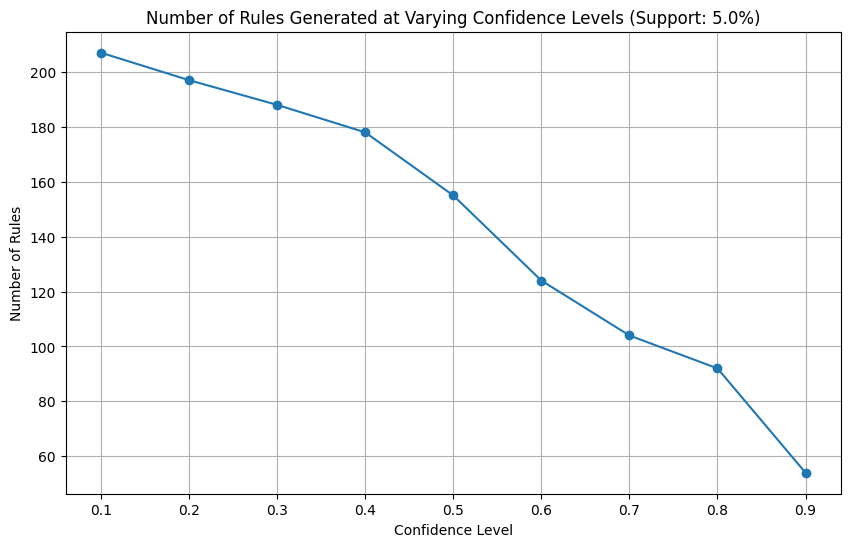

In [ ]:
#Checking for support = 0.10
min_support = 0.05
#APRIORI ALGORITHM
def get_frequent_itemsets(data, min_support):
    itemsets = {}
    num_transactions = len(data)

    # 1-itemsets
    for item in data.columns:
        support = data[item].sum() / num_transactions
        if support >= min_support:
            itemsets[frozenset([item])] = support

    k = 2
    current_itemsets = itemsets

    while current_itemsets:
        # Generate candidate k-itemsets from (k-1)-itemsets
        candidate_itemsets = {}
        keys = list(current_itemsets.keys())
        for i in range(len(keys)):
            for j in range(i + 1, len(keys)):
                union_set = keys[i] | keys[j]
                if len(union_set) == k:
                    support = (data[list(union_set)].min(axis=1) > 0).sum() / num_transactions
                    if support >= min_support:
                        candidate_itemsets[union_set] = support

        # Add candidate k-itemsets to frequent itemsets
        itemsets.update(candidate_itemsets)
        current_itemsets = candidate_itemsets
        k += 1

    return itemsets

frequent_itemsets = get_frequent_itemsets(basket_3, min_support)

# Function to generate association rules with variable confidence
def get_association_rules(frequent_itemsets, confidence):
    rules = []
    for itemset in frequent_itemsets.keys():
        if len(itemset) > 1:
            for antecedent in map(frozenset, combinations(itemset, len(itemset) - 1)):
                consequent = itemset - antecedent
                support = frequent_itemsets[itemset]
                antecedent_support = frequent_itemsets[antecedent]
                rule_confidence = support / antecedent_support
                if rule_confidence >= confidence:
                    lift = rule_confidence / frequent_itemsets[consequent]
                    rules.append((antecedent, consequent, support, rule_confidence, lift))
    return pd.DataFrame(rules, columns=['Antecedent', 'Consequent', 'Support', 'Confidence', 'Lift'])

# W define confidence levels to test and list to store rule counts
confidence_levels = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
rule_counts = []

# Next we generate rules for each confidence level and store the count
for confidence in confidence_levels:
    rules = get_association_rules(frequent_itemsets, confidence)
    rule_counts.append(len(rules))

# Plotting the results
plt.figure(figsize=(10, 6))
plt.plot(confidence_levels, rule_counts, marker='o')
plt.title(f'Number of Rules Generated at Varying Confidence Levels (Support: {min_support*100}%)')
plt.xlabel('Confidence Level')
plt.ylabel('Number of Rules')
plt.grid()
plt.show()

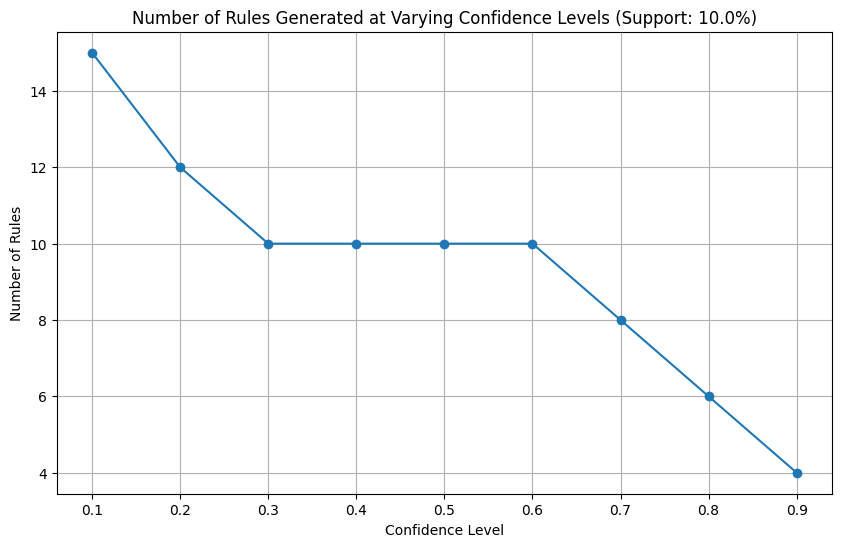

In [ ]:
#Checking for support = 0.10
min_support = 0.10
#APRIORI ALGORITHM
def get_frequent_itemsets(data, min_support):
    itemsets = {}
    num_transactions = len(data)

    # 1-itemsets
    for item in data.columns:
        support = data[item].sum() / num_transactions
        if support >= min_support:
            itemsets[frozenset([item])] = support

    k = 2
    current_itemsets = itemsets

    while current_itemsets:
        # Generate candidate k-itemsets from (k-1)-itemsets
        candidate_itemsets = {}
        keys = list(current_itemsets.keys())
        for i in range(len(keys)):
            for j in range(i + 1, len(keys)):
                union_set = keys[i] | keys[j]
                if len(union_set) == k:
                    support = (data[list(union_set)].min(axis=1) > 0).sum() / num_transactions
                    if support >= min_support:
                        candidate_itemsets[union_set] = support

        # Add candidate k-itemsets to frequent itemsets
        itemsets.update(candidate_itemsets)
        current_itemsets = candidate_itemsets
        k += 1

    return itemsets

frequent_itemsets = get_frequent_itemsets(basket_3, min_support)

# Function to generate association rules with variable confidence
def get_association_rules(frequent_itemsets, confidence):
    rules = []
    for itemset in frequent_itemsets.keys():
        if len(itemset) > 1:
            for antecedent in map(frozenset, combinations(itemset, len(itemset) - 1)):
                consequent = itemset - antecedent
                support = frequent_itemsets[itemset]
                antecedent_support = frequent_itemsets[antecedent]
                rule_confidence = support / antecedent_support
                if rule_confidence >= confidence:
                    lift = rule_confidence / frequent_itemsets[consequent]
                    rules.append((antecedent, consequent, support, rule_confidence, lift))
    return pd.DataFrame(rules, columns=['Antecedent', 'Consequent', 'Support', 'Confidence', 'Lift'])

# We define confidence levels to test and list to store rule counts
confidence_levels = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
rule_counts = []

# Next we generate rules for each confidence level and store the count
for confidence in confidence_levels:
    rules = get_association_rules(frequent_itemsets, confidence)
    rule_counts.append(len(rules))

# Plotting the results
plt.figure(figsize=(10, 6))
plt.plot(confidence_levels, rule_counts, marker='o')
plt.title(f'Number of Rules Generated at Varying Confidence Levels (Support: {min_support*100}%)')
plt.xlabel('Confidence Level')
plt.ylabel('Number of Rules')
plt.grid()
plt.show()

In [ ]:
#Selecting appropriate support and confidence metrics for our analysis
min_support = 0.05
min_confidence = 0.7
frequent_itemsets_3 = get_frequent_itemsets(basket_3, min_support)
rules_apriori_3 = get_association_rules(frequent_itemsets_3, min_confidence)

# Display the generated rules
rules_apriori_3

,Antecedent,Consequent,Support,Confidence,Lift
0,(4 TRADITIONAL SPINNING TOPS),(POSTAGE),0.066667,1.000000,1.451613
1,(ASSORTED COLOUR BIRD ORNAMENT),(6 RIBBONS RUSTIC CHARM),0.100000,0.750000,4.500000
2,(6 RIBBONS RUSTIC CHARM),(POSTAGE),0.144444,0.866667,1.258065
3,(RED RETROSPOT TAPE),(6 RIBBONS RUSTIC CHARM),0.066667,0.857143,5.142857
4,(ALARM CLOCK BAKELIKE PINK),(POSTAGE),0.066667,1.000000,1.451613
5,(ALARM CLOCK BAKELIKE RED),(POSTAGE),0.055556,0.833333,1.209677
6,(PLASTERS IN TIN CIRCUS PARADE),(ASSORTED COLOUR BIRD ORNAMENT),0.055556,0.714286,5.357143
7,(ASSORTED COLOUR BIRD ORNAMENT),(POSTAGE),0.122222,0.916667,1.330645
8,(BAKING SET 9 PIECE RETROSPOT),(POSTAGE),0.055556,0.833333,1.209677
9,(BLUE HARMONICA IN BOX),(POSTAGE),0.055556,1.000000,1.451613


In [ ]:
rules_apriori_3.shape #Checking the no of rules generated

(104, 5)

In [ ]:
# Display top 10 rules by Support
top_10_support = rules_apriori_3.sort_values(by="Support", ascending=False).head(10)
print("Top 10 Rules by Support")
print(tabulate(top_10_support, headers='keys', tablefmt='pretty'))

# Display top 10 rules by Confidence
top_10_confidence = rules_apriori_3.sort_values(by="Confidence", ascending=False).head(10)
print("\nTop 10 Rules by Confidence")
print(tabulate(top_10_confidence, headers='keys', tablefmt='pretty'))

# Display top 10 rules by Lift
top_10_lift = rules_apriori_3.sort_values(by="Lift", ascending=False).head(10)
print("\nTop 10 Rules by Lift")
print(tabulate(top_10_lift, headers='keys', tablefmt='pretty'))

Top 10 Rules by Support
+----+------------------------------------------------------------------------+---------------------------------------+---------------------+--------------------+--------------------+
|    |                               Antecedent                               |              Consequent               |       Support       |     Confidence     |        Lift        |
+----+------------------------------------------------------------------------+---------------------------------------+---------------------+--------------------+--------------------+
| 47 |                frozenset({'REGENCY CAKESTAND 3 TIER'})                 |        frozenset({'POSTAGE'})         | 0.18888888888888888 | 0.7727272727272727 | 1.1217008797653958 |
| 2  |                 frozenset({'6 RIBBONS RUSTIC CHARM'})                  |        frozenset({'POSTAGE'})         | 0.14444444444444443 | 0.8666666666666666 | 1.2580645161290323 |
| 33 |             frozenset({'PACK OF 72 RETROSPOT CAKE

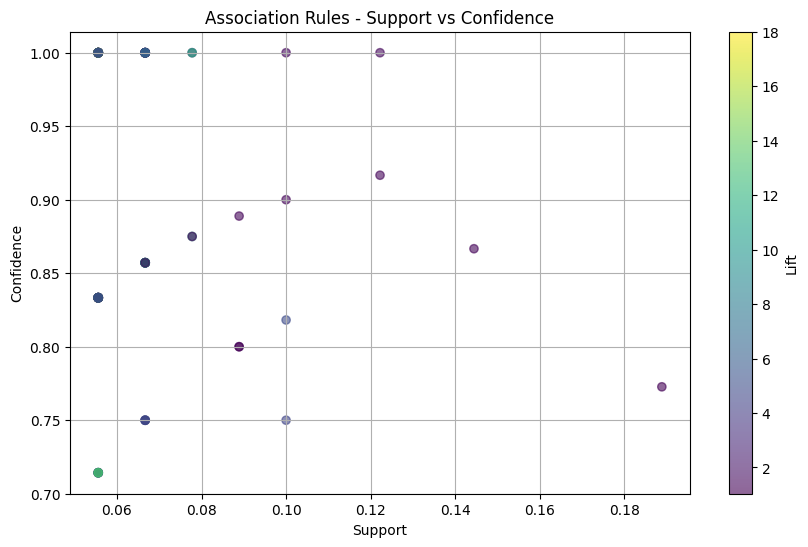

In [ ]:
#Plotting a scatter plot for analysis
plt.figure(figsize=(10, 6))
scatter = plt.scatter(rules_apriori_3['Support'], rules_apriori_3['Confidence'],
                      c=rules_apriori_3['Lift'], cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Lift')
plt.title('Association Rules - Support vs Confidence')
plt.xlabel('Support')
plt.ylabel('Confidence')
plt.grid(True)
plt.show()

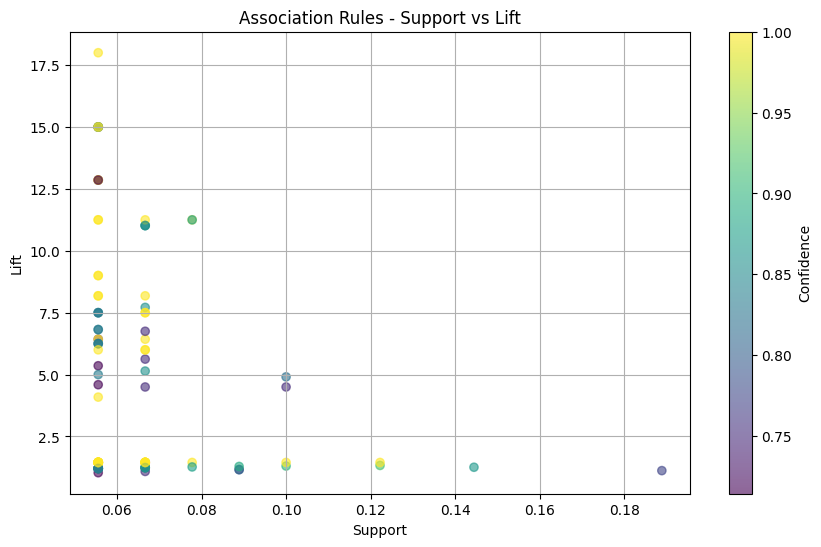

In [ ]:
#Plotting a scatter plot for analysis
plt.figure(figsize=(10, 6))
scatter = plt.scatter(rules_apriori_3['Support'], rules_apriori_3['Lift'],
                      c=rules_apriori_3['Confidence'], cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Confidence')
plt.title('Association Rules - Support vs Lift')
plt.xlabel('Support')
plt.ylabel('Lift')
plt.grid(True)
plt.show()

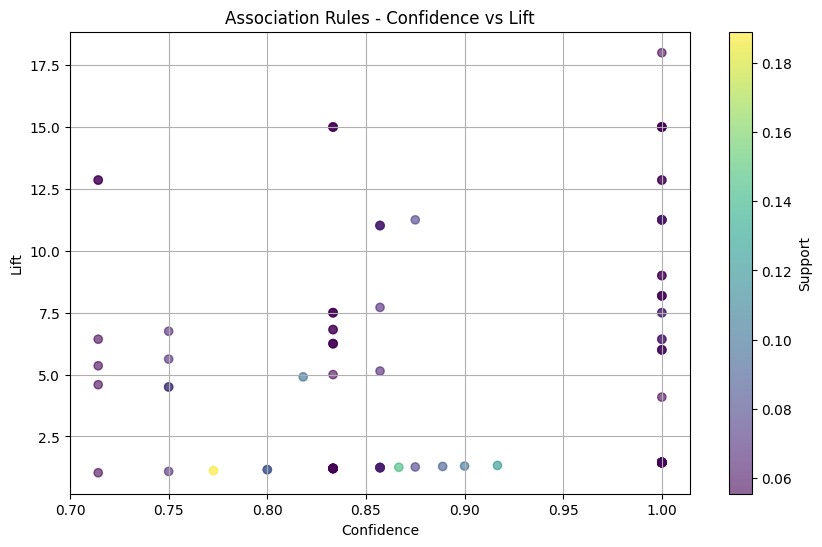

In [ ]:
#Plotting a scatter plot for analysis
plt.figure(figsize=(10, 6))
scatter = plt.scatter(rules_apriori_3['Confidence'], rules_apriori_3['Lift'],
                      c=rules_apriori_3['Support'], cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Support')
plt.title('Association Rules - Confidence vs Lift')
plt.xlabel('Confidence')
plt.ylabel('Lift')
plt.grid(True)
plt.show()

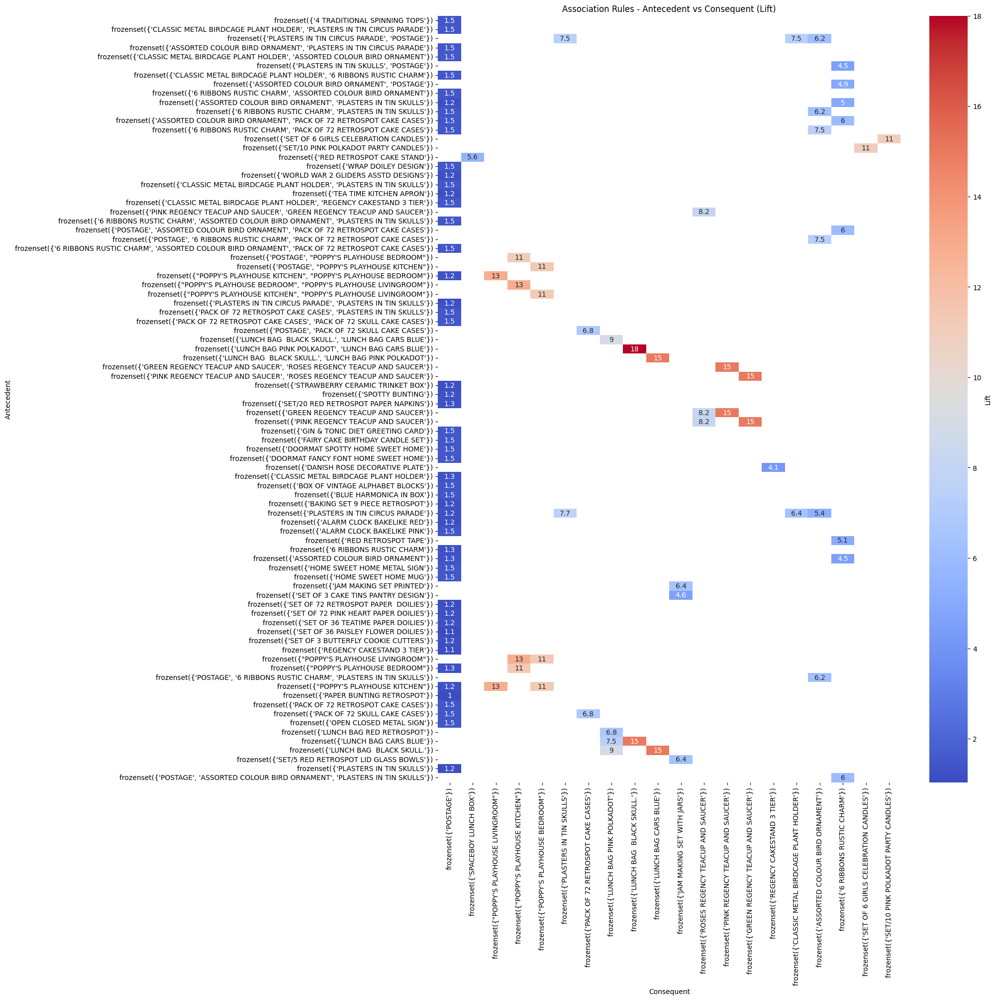

In [ ]:
pivot_table = rules_apriori_3.pivot(index='Antecedent', columns='Consequent', values='Lift')
plt.figure(figsize=(15, 20))
sns.heatmap(pivot_table, annot=True, cmap='coolwarm', cbar_kws={'label': 'Lift'})
plt.title('Association Rules - Antecedent vs Consequent (Lift)')
plt.xlabel('Consequent')
plt.ylabel('Antecedent')
plt.show()

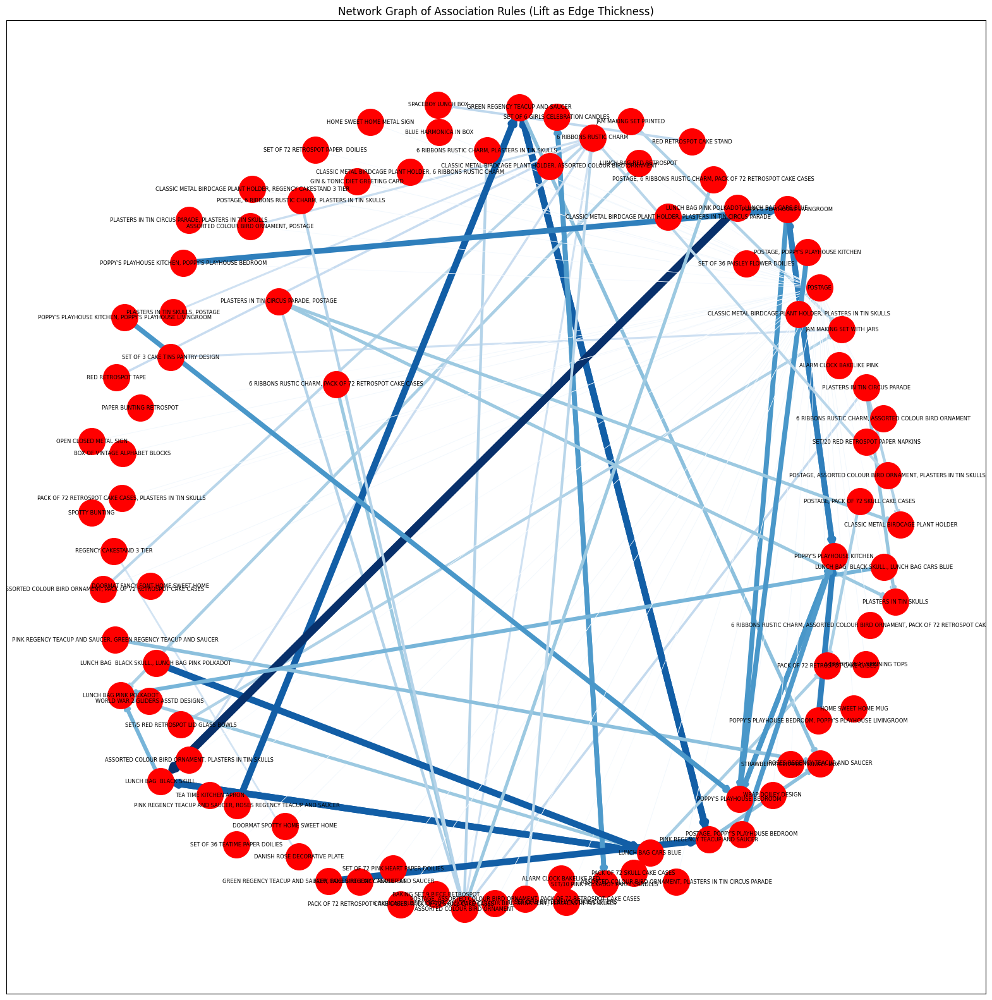

In [ ]:
#Plotting a network graph amongst the rules to visualize the rules
G = nx.DiGraph()

# Add edges to the graph with lift as edge attribute
for _, row in rules_apriori_3.iterrows():
    G.add_edge(', '.join(row['Antecedent']), ', '.join(row['Consequent']), weight=row['Lift'])

# Draw the graph
plt.figure(figsize=(20, 20))
pos = nx.spring_layout(G, k=4)  # positions for all nodes

# Draw nodes and edges with color and thickness based on lift
edges = G.edges(data=True)
nx.draw_networkx_nodes(G, pos, node_size=900, node_color='red')
nx.draw_networkx_labels(G, pos, font_size=6)
nx.draw_networkx_edges(G, pos, edgelist=edges, width=[d['weight'] * 0.5 for (_, _, d) in edges],
                       edge_color=[d['weight'] for (_, _, d) in edges], edge_cmap=plt.cm.Blues)

plt.title('Network Graph of Association Rules (Lift as Edge Thickness)')
plt.show()

## 4.4) Market Basket Analysis for Ireland

In [ ]:
df4 = df[df['Country'] == 'EIRE']  #First we select all rows where the country is Ireland

In [ ]:
df4.head() #Updated dataframe

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,TotalSales
1404,536540,22968,ROSE COTTAGE KEEPSAKE BOX,4,2010-12-01 14:05:00,9.95,14911.0,EIRE,39.8
1405,536540,85071A,BLUE CHARLIE+LOLA PERSONAL DOORSIGN,6,2010-12-01 14:05:00,2.95,14911.0,EIRE,17.7
1406,536540,85071C,"CHARLIE+LOLA""EXTREMELY BUSY"" SIGN",6,2010-12-01 14:05:00,2.55,14911.0,EIRE,15.3
1407,536540,22355,CHARLOTTE BAG SUKI DESIGN,50,2010-12-01 14:05:00,0.85,14911.0,EIRE,42.5
1408,536540,21579,LOLITA DESIGN COTTON TOTE BAG,6,2010-12-01 14:05:00,2.25,14911.0,EIRE,13.5


In [ ]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7238 entries, 1404 to 539155
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   InvoiceNo    7238 non-null   object        
 1   StockCode    7238 non-null   object        
 2   Description  7238 non-null   object        
 3   Quantity     7238 non-null   int64         
 4   InvoiceDate  7238 non-null   datetime64[ns]
 5   UnitPrice    7238 non-null   float64       
 6   CustomerID   7238 non-null   float64       
 7   Country      7238 non-null   object        
 8   TotalSales   7238 non-null   float64       
dtypes: datetime64[ns](1), float64(3), int64(1), object(4)
memory usage: 565.5+ KB


In [ ]:
#Creating the basket to apply apriori algorithm on
basket_4 = df4.groupby(['InvoiceNo', 'Description'])['Quantity'].sum().unstack().reset_index().fillna(0).set_index('InvoiceNo')
def encode_units(x):
    if x <= 0:
        return 0
    if x >= 1:
        return 1
#apply function to data using applymap.
basket_4 = basket_4.applymap(encode_units)
basket_4.head()

<ipython-input-67-c500868199b9>:8: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  basket_4 = basket_4.applymap(encode_units)


Description  10 COLOUR SPACEBOY PEN  12 COLOURED PARTY BALLOONS  \
InvoiceNo                                                         
536540                            0                           0   
536541                            0                           0   
536803                            0                           0   
536890                            0                           0   
536975                            0                           0   

Description  12 DAISY PEGS IN WOOD BOX  12 EGG HOUSE PAINTED WOOD  \
InvoiceNo                                                           
536540                               0                          0   
536541                               0                          0   
536803                               0                          0   
536890                               0                          0   
536975                               0                          0   

Description  12 IVORY ROSE PEG PLACE SETTINGS  \
InvoiceNo                                       
536540                                      0   
536541                                      0   
536803                                      0   
536890                                      0   
536975                                      0   

Description  12 MESSAGE CARDS WITH ENVELOPES  12 PENCIL SMALL TUBE WOODLAND  \
InvoiceNo                                                                     
536540                                     0                              0   
536541                                     0                              0   
536803                                     0                              0   
536890                                     0                              0   
536975                                     0                              0   

Description  12 PENCILS SMALL TUBE RED RETROSPOT  12 PENCILS TALL TUBE POSY  \
InvoiceNo                                                                     
536540                                         0                          0   
536541                                         0                          0   
536803                                         0                          0   
536890                                         0                          0   
536975                                         0                          0   

Description  12 PENCILS TALL TUBE RED RETROSPOT  12 PENCILS TALL TUBE SKULLS  \
InvoiceNo                                                                      
536540                                        0                            0   
536541                                        0                            0   
536803                                        0                            0   
536890                                        0                            0   
536975                                        0                            1   

Description  12 PENCILS TALL TUBE WOODLAND  12 PINK HEN+CHICKS IN BASKET  \
InvoiceNo                                                                  
536540                                   0                             0   
536541                                   0                             0   
536803                                   0                             0   
536890                                   0                             0   
536975                                   1                             0   

Description  12 PINK ROSE PEG PLACE SETTINGS  12 RED ROSE PEG PLACE SETTINGS  \
InvoiceNo                                                                      
536540                                     0                               0   
536541                                     0                               0   
536803                                     0                               0   
536890                                     0                               0   
536975              

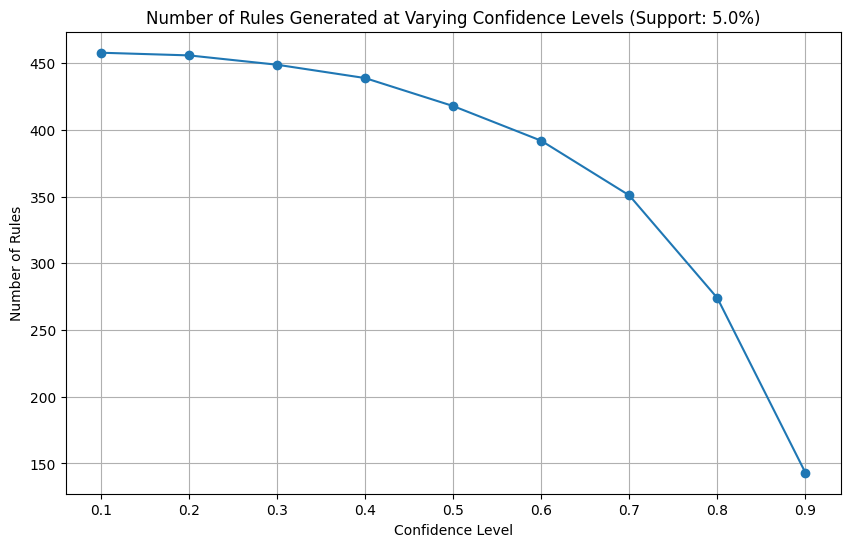

In [ ]:
#Checking for support = 0.05
min_support = 0.05
#APRIORI ALGORITHM
def get_frequent_itemsets(data, min_support):
    itemsets = {}
    num_transactions = len(data)

    # 1-itemsets
    for item in data.columns:
        support = data[item].sum() / num_transactions
        if support >= min_support:
            itemsets[frozenset([item])] = support

    k = 2
    current_itemsets = itemsets

    while current_itemsets:
        # Generate candidate k-itemsets from (k-1)-itemsets
        candidate_itemsets = {}
        keys = list(current_itemsets.keys())
        for i in range(len(keys)):
            for j in range(i + 1, len(keys)):
                union_set = keys[i] | keys[j]
                if len(union_set) == k:
                    support = (data[list(union_set)].min(axis=1) > 0).sum() / num_transactions
                    if support >= min_support:
                        candidate_itemsets[union_set] = support

        # Add candidate k-itemsets to frequent itemsets
        itemsets.update(candidate_itemsets)
        current_itemsets = candidate_itemsets
        k += 1

    return itemsets

frequent_itemsets = get_frequent_itemsets(basket_4, min_support)

# Function to generate association rules with variable confidence
def get_association_rules(frequent_itemsets, confidence):
    rules = []
    for itemset in frequent_itemsets.keys():
        if len(itemset) > 1:
            for antecedent in map(frozenset, combinations(itemset, len(itemset) - 1)):
                consequent = itemset - antecedent
                support = frequent_itemsets[itemset]
                antecedent_support = frequent_itemsets[antecedent]
                rule_confidence = support / antecedent_support
                if rule_confidence >= confidence:
                    lift = rule_confidence / frequent_itemsets[consequent]
                    rules.append((antecedent, consequent, support, rule_confidence, lift))
    return pd.DataFrame(rules, columns=['Antecedent', 'Consequent', 'Support', 'Confidence', 'Lift'])

# We define confidence levels to test and list to store rule counts
confidence_levels = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
rule_counts = []

# Next we generate rules for each confidence level and store the count
for confidence in confidence_levels:
    rules = get_association_rules(frequent_itemsets, confidence)
    rule_counts.append(len(rules))

# Plotting the results
plt.figure(figsize=(10, 6))
plt.plot(confidence_levels, rule_counts, marker='o')
plt.title(f'Number of Rules Generated at Varying Confidence Levels (Support: {min_support*100}%)')
plt.xlabel('Confidence Level')
plt.ylabel('Number of Rules')
plt.grid()
plt.show()

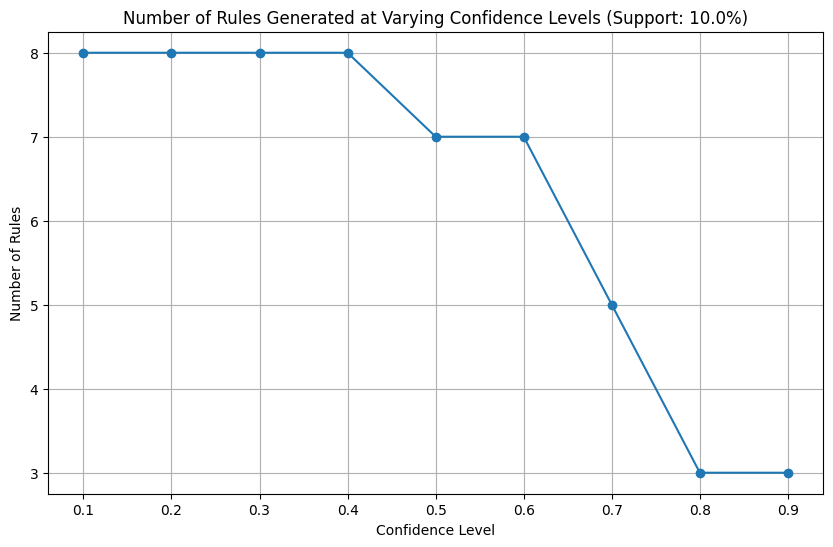

In [ ]:
#Checking for support = 0.10
min_support = 0.10
#APRIORI ALGORITHM
def get_frequent_itemsets(data, min_support):
    itemsets = {}
    num_transactions = len(data)

    # 1-itemsets
    for item in data.columns:
        support = data[item].sum() / num_transactions
        if support >= min_support:
            itemsets[frozenset([item])] = support

    k = 2
    current_itemsets = itemsets

    while current_itemsets:
        # Generate candidate k-itemsets from (k-1)-itemsets
        candidate_itemsets = {}
        keys = list(current_itemsets.keys())
        for i in range(len(keys)):
            for j in range(i + 1, len(keys)):
                union_set = keys[i] | keys[j]
                if len(union_set) == k:
                    support = (data[list(union_set)].min(axis=1) > 0).sum() / num_transactions
                    if support >= min_support:
                        candidate_itemsets[union_set] = support

        # Add candidate k-itemsets to frequent itemsets
        itemsets.update(candidate_itemsets)
        current_itemsets = candidate_itemsets
        k += 1

    return itemsets

frequent_itemsets = get_frequent_itemsets(basket_4, min_support)

# Function to generate association rules with variable confidence
def get_association_rules(frequent_itemsets, confidence):
    rules = []
    for itemset in frequent_itemsets.keys():
        if len(itemset) > 1:
            for antecedent in map(frozenset, combinations(itemset, len(itemset) - 1)):
                consequent = itemset - antecedent
                support = frequent_itemsets[itemset]
                antecedent_support = frequent_itemsets[antecedent]
                rule_confidence = support / antecedent_support
                if rule_confidence >= confidence:
                    lift = rule_confidence / frequent_itemsets[consequent]
                    rules.append((antecedent, consequent, support, rule_confidence, lift))
    return pd.DataFrame(rules, columns=['Antecedent', 'Consequent', 'Support', 'Confidence', 'Lift'])

# We define confidence levels to test and list to store rule counts
confidence_levels = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
rule_counts = []

# Next we generate rules for each confidence level and store the count
for confidence in confidence_levels:
    rules = get_association_rules(frequent_itemsets, confidence)
    rule_counts.append(len(rules))

# Plotting the results
plt.figure(figsize=(10, 6))
plt.plot(confidence_levels, rule_counts, marker='o')
plt.title(f'Number of Rules Generated at Varying Confidence Levels (Support: {min_support*100}%)')
plt.xlabel('Confidence Level')
plt.ylabel('Number of Rules')
plt.grid()
plt.show()

In [ ]:
#Selecting appropriate support and confidence metrics for our analysis
min_support=0.05
min_confidence = 0.85
frequent_itemsets_4 = get_frequent_itemsets(basket_4, min_support)
rules_apriori_4 = get_association_rules(frequent_itemsets_4, min_confidence)

# Display the generated rules
rules_apriori_4

,Antecedent,Consequent,Support,Confidence,Lift
0,(PINK REGENCY TEACUP AND SAUCER),(GREEN REGENCY TEACUP AND SAUCER),0.100000,0.928571,7.100840
1,(GREEN REGENCY TEACUP AND SAUCER),(ROSES REGENCY TEACUP AND SAUCER),0.119231,0.911765,5.387701
2,(PINK REGENCY TEACUP AND SAUCER),(ROSES REGENCY TEACUP AND SAUCER),0.103846,0.964286,5.698052
3,(REGENCY TEA PLATE GREEN),(REGENCY CAKESTAND 3 TIER),0.069231,0.857143,3.537415
4,(REGENCY TEAPOT ROSES),(REGENCY SUGAR BOWL GREEN),0.065385,0.944444,10.231481
5,(REGENCY TEA PLATE GREEN),(REGENCY TEA PLATE PINK),0.069231,0.857143,11.142857
6,(REGENCY TEA PLATE PINK),(REGENCY TEA PLATE GREEN),0.069231,0.900000,11.142857
7,(REGENCY TEA PLATE GREEN),(REGENCY TEA PLATE ROSES),0.073077,0.904762,9.801587
8,(REGENCY TEA PLATE PINK),(REGENCY TEA PLATE ROSES),0.065385,0.850000,9.208333
9,(REGENCY TEAPOT ROSES),(ROSES REGENCY TEACUP AND SAUCER),0.061538,0.888889,5.252525


In [ ]:
rules_apriori_4.shape #Checking the no of rules generated

(231, 5)

In [ ]:
# Display top 10 rules by Support
top_10_support = rules_apriori_4.sort_values(by="Support", ascending=False).head(10)
print("Top 10 Rules by Support")
print(tabulate(top_10_support, headers='keys', tablefmt='pretty'))

# Display top 10 rules by Confidence
top_10_confidence = rules_apriori_4.sort_values(by="Confidence", ascending=False).head(10)
print("\nTop 10 Rules by Confidence")
print(tabulate(top_10_confidence, headers='keys', tablefmt='pretty'))

# Display top 10 rules by Lift
top_10_lift = rules_apriori_4.sort_values(by="Lift", ascending=False).head(10)
print("\nTop 10 Rules by Lift")
print(tabulate(top_10_lift, headers='keys', tablefmt='pretty'))

Top 10 Rules by Support
+-----+--------------------------------------------------------------------------------------------------------------+------------------------------------------------+---------------------+--------------------+-------------------+
|     |                                                  Antecedent                                                  |                   Consequent                   |       Support       |     Confidence     |       Lift        |
+-----+--------------------------------------------------------------------------------------------------------------+------------------------------------------------+---------------------+--------------------+-------------------+
|  1  |                                frozenset({'GREEN REGENCY TEACUP AND SAUCER'})                                | frozenset({'ROSES REGENCY TEACUP AND SAUCER'}) | 0.11923076923076924 | 0.9117647058823529 | 5.387700534759358 |
|  2  |                                frozenset({'P

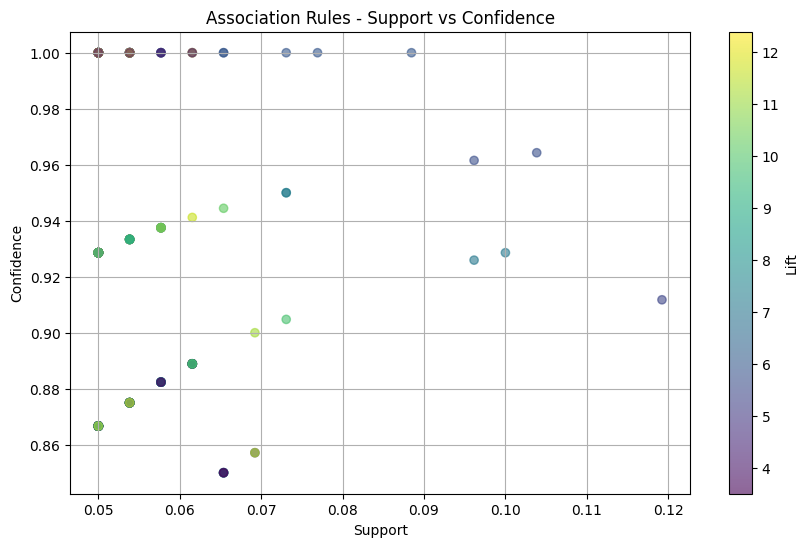

In [ ]:
#Plotting a scatter plot for analysis
plt.figure(figsize=(10, 6))
scatter = plt.scatter(rules_apriori_4['Support'], rules_apriori_4['Confidence'],
                      c=rules_apriori_4['Lift'], cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Lift')
plt.title('Association Rules - Support vs Confidence')
plt.xlabel('Support')
plt.ylabel('Confidence')
plt.grid(True)
plt.show()

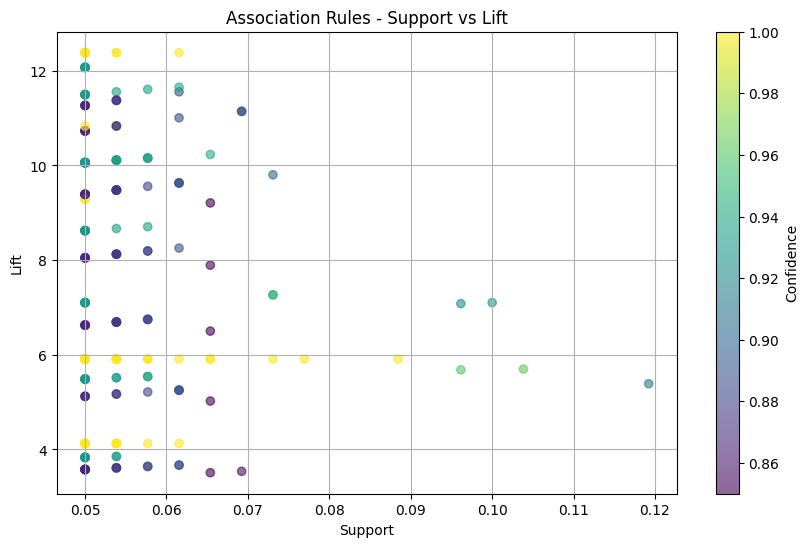

In [ ]:
#Plotting a scatter plot for analysis
plt.figure(figsize=(10, 6))
scatter = plt.scatter(rules_apriori_4['Support'], rules_apriori_4['Lift'],
                      c=rules_apriori_4['Confidence'], cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Confidence')
plt.title('Association Rules - Support vs Lift')
plt.xlabel('Support')
plt.ylabel('Lift')
plt.grid(True)
plt.show()

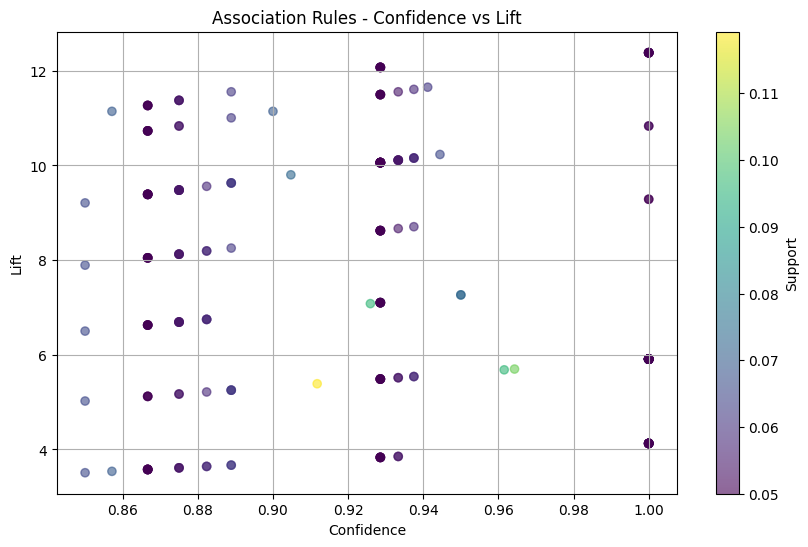

In [ ]:
#Plotting a scatter plot for analysis
plt.figure(figsize=(10, 6))
scatter = plt.scatter(rules_apriori_4['Confidence'], rules_apriori_4['Lift'],
                      c=rules_apriori_4['Support'], cmap='viridis', alpha=0.6)
plt.colorbar(scatter, label='Support')
plt.title('Association Rules - Confidence vs Lift')
plt.xlabel('Confidence')
plt.ylabel('Lift')
plt.grid(True)
plt.show()

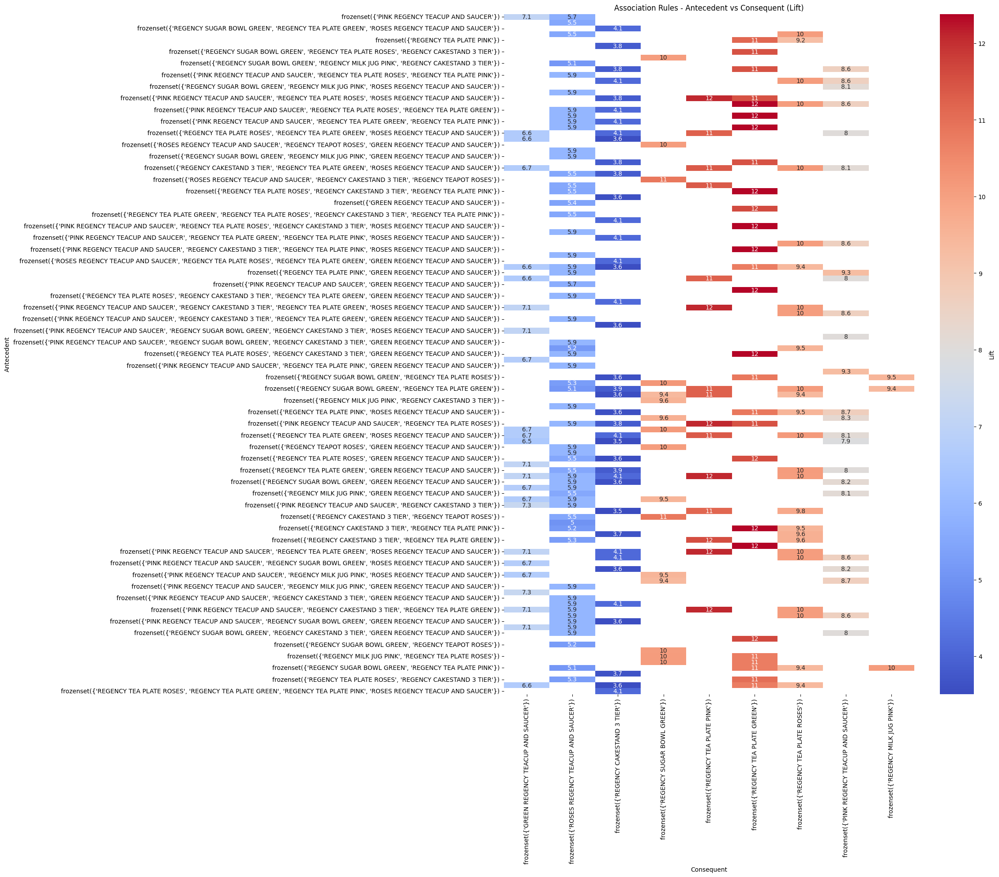

In [ ]:
#Plotting a pivot table for analysis
pivot_table = rules_apriori_4.pivot(index='Antecedent', columns='Consequent', values='Lift')
plt.figure(figsize=(15, 20))
sns.heatmap(pivot_table, annot=True, cmap='coolwarm', cbar_kws={'label': 'Lift'})
plt.title('Association Rules - Antecedent vs Consequent (Lift)')
plt.xlabel('Consequent')
plt.ylabel('Antecedent')
plt.show()

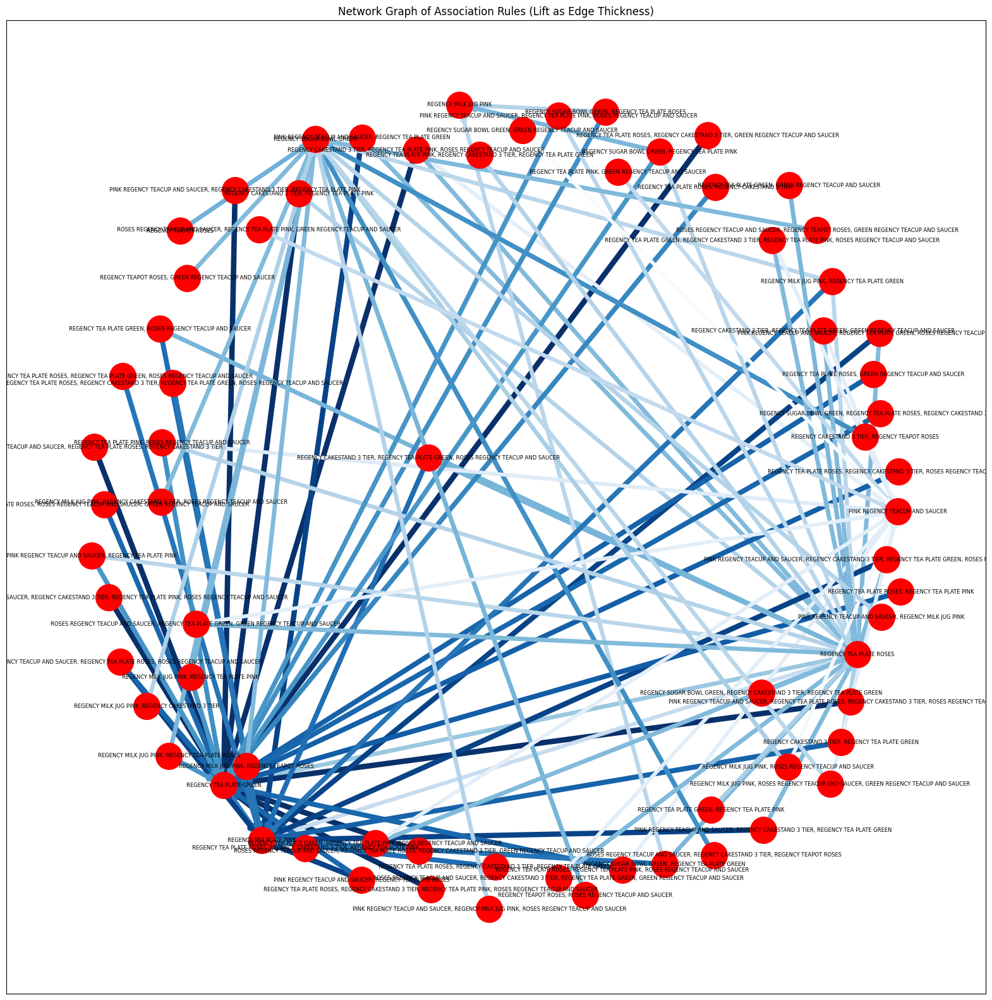

In [ ]:
#Plotting a network graph amongst the rules to visualize the rules
G = nx.DiGraph()
top_100_rules = rules_apriori_4.sort_values(by="Lift", ascending=False).head(100)

# Add edges to the graph with lift as edge attribute
for _, row in top_100_rules.iterrows():
    G.add_edge(', '.join(row['Antecedent']), ', '.join(row['Consequent']), weight=row['Lift'])

# Draw the graph
plt.figure(figsize=(20, 20))
pos = nx.spring_layout(G, k=4)  # positions for all nodes

# Draw nodes and edges with color and thickness based on lift
edges = G.edges(data=True)
nx.draw_networkx_nodes(G, pos, node_size=900, node_color='red')
nx.draw_networkx_labels(G, pos, font_size=6)
nx.draw_networkx_edges(G, pos, edgelist=edges, width=[d['weight'] * 0.5 for (_, _, d) in edges],
                       edge_color=[d['weight'] for (_, _, d) in edges], edge_cmap=plt.cm.Blues)

plt.title('Network Graph of Association Rules (Lift as Edge Thickness)')
plt.show()